

# Workshop 2: Antimicrobial resistance

<img src="freestocks-nss2eRzQwgw-unsplash.jpg" style="float: right;" width="300" >Antimicrobial resistance (AMR) occurs when microorganisms develop the ability to survive exposure to antimicrobial drugs. This means that these drugs are no longer effective at killing or controlling the growth of the resistant microorganisms, which can lead to serious infections in humans and animals. 

AMR is a global public health threat as it can lead to the spread of untreatable diseases and increase the risk of outbreaks. EARS-Net (European Antimicrobial Resistance Surveillance Network) is a surveillance network  that monitors AMR in bacteria that cause infections in humans, under the coordination of the European Centre for Disease Prevention and Control (ECDC). 

EARS-Net collects data on a range of bacterial pathogens, including Escherichia coli, Staphylococcus aureus, and Streptococcus pneumoniae, as well as on the susceptibility of these bacteria to various antimicrobial drugs. The data is collected from a network of laboratories across the EU and is analyzed by the ECDC to generate annual reports on the status of AMR in the EU.

In this workshop, we will use Python programming to analyse data from EARS-Net to help us understand the magnitude of the problem of AMR, and to see how the prevalence of AMR has changed over time. 

#### Intended Learning Outcomes

By the end of this workshop, you should be able to:

* Describe how AMR prevalence has changed within Europe over the past decade, and how AMR prevalence differs geographically. 
* Import filter and select data using the Pandas module in Python
* Write code to produce appropriate graphs using the Seaborn module in Python

### Working as a group

The dataset we will analyse today is large - it contains AMR data for 8 bacterial species across 30 countries for 22 years. 

You should work together as a group:

* **Discuss your code, ideas and answers with other members of the group.** Peer assistance (not copying answers but talking through your approaches to the problem) can help avoid you getting stuck, increase how much you learn from the session and make it more enjoyable.

* **Co-ordinate your analyses.** Split the more involved tasks between the group: select different countries and organisms to look at and compare what you observe. 

### Final task

**Assemble a single figure that illustrates the problem of antimicrobial resistance.** Write a paragraph to accompany your image explaining the need for the development of new antimicrobals and the better management of current ones. 


# Dataset Information

Data were downloaded from https://atlas.ecdc.europa.eu/public/index.aspx?Dataset=27&HealthTopic=4. All indicators and all time periods were downloaded.
    
For further information about the data, see 'AMR_Information_about_the_data_2021.pdf'


### Importing modules

As discussed in Lecture 2, we need to import external Python libraries (modules) before we can use them. By importing these libraries, the code we write will have access to a range of tools and functions for working with and visualising data. 

Here we import: 
* pandas: A library for data manipulation and analysis in Python. It provides tools for reading and writing data, handling missing values, and manipulating data frames.
* matplotlib: A library for data visualization in Python. It provides functions for creating a wide variety of plots and charts, including scatter plots, bar plots, histograms, and many more.
* seaborn: A library for statistical data visualization in Python. It is built on top of matplotlib and provides a high-level interface for drawing statistical graphics.



In [1]:
# import modules
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Task 2.1: Loading in the data

Before we can analyse or visulise the dataset, we first need to load it. The data is provided as a CSV (Comma Separated Values) file. 

To load a CSV file into Pandas, you can use the read_csv function of the Pandas library. Here is an example of how to use read_csv:

```Python
import pandas as pd

# Load the CSV file into a DataFrame named 'df'
df = pd.read_csv('file.csv')

```

In the example above, `read_csv()` reads the CSV file called 'file.csv' from the specified path and loads it into a Pandas DataFrame.

Load the data in the file named 'ECDC_percentage_resistant.csv' into a Pandas dataframe called amr_df


In [2]:
#Task 2.1 Solution
amr_df = pd.read_csv('ECDC_percentage_resistant.csv')

# Task 2.2: Checking the loaded data

Before we start working with the data, you should check that it has been correctly loaded in. Are your data types as expected?

Run the following commands to view your dataframe and its attributes:

|Command|Description|
|-------|:-----------|
|amr_df.head(5)|The head method displays the first 5 lines of the dataframe|
|amr_df.info()| The info method is useful for getting a quick overview of the data in a DataFrame, especially when working with large datasets. It displays the number of rows and columns in the DataFrame, the data type of each column, the number of non-null values in each column, and the memory usage of the DataFrame.|


In [3]:
amr_df.head(5)

,Organism,AntimicrobialGroup,Indicator,Year,RegionCode,RegionName,PercentageResistant
0,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,AT,Austria,NaN
1,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,BE,Belgium,NaN
2,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,BG,Bulgaria,58.461538
3,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,CY,Cyprus,52.173913
4,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,CZ,Czechia,NaN


In [4]:
amr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15929 entries, 0 to 15928
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Organism             15929 non-null  object 
 1   AntimicrobialGroup   15929 non-null  object 
 2   Indicator            15929 non-null  object 
 3   Year                 15929 non-null  int64  
 4   RegionCode           15929 non-null  object 
 5   RegionName           15929 non-null  object 
 6   PercentageResistant  14178 non-null  float64
dtypes: float64(1), int64(1), object(5)
memory usage: 871.2+ KB


# Task 2.3: Counting Species
    
You should now explore the dataset to find out:

a) What bacterial species are included and how many data entries there are for each?

b) Which countries are represented in the dataset?

c) Which antibiotic classes are included in data?

*Hint: value_counts() produces a frequency table for a categorial variable*

In [5]:
#Number of Organisms Included
amr_df.Organism.value_counts()

Escherichia coli            3778
Pseudomonas aeruginosa      3024
Klebsiella pneumoniae       2520
Enterococcus faecalis       1887
Enterococcus faecium        1886
Acinetobacter spp.          1192
Streptococcus pneumoniae    1008
Staphylococcus aureus        634
Name: Organism, dtype: int64

In [6]:
#Countries Included
freq=amr_df.RegionName.value_counts()

In [7]:
#Number of Antibiotics Included

amr_df.AntimicrobialGroup.value_counts()

Aminoglycosides                                                                                             1936
Fluoroquinolones                                                                                            1936
Carbapenems                                                                                                 1934
Aminopenicillins                                                                                            1888
Vancomycin                                                                                                  1258
High-level gentamicin                                                                                       1257
Combined resistance (third-generation cephalosporin, fluoroquinolones and aminoglycoside)                   1134
Third-generation cephalosporins                                                                             1134
Meticillin (MRSA)                                                                               

In [8]:
# Students may prefer to use crosstab to produce a contingency table
pd.crosstab(amr_df.Organism, amr_df.AntimicrobialGroup)

AntimicrobialGroup,Aminoglycosides,Aminopenicillins,Carbapenems,Ceftazidime,"Combined resistance (at least three of piperac. and tazob., fluoroq., ceftaz., aminogl. and carbapenems)","Combined resistance (fluoroquinolones, aminoglycosides and carbapenems)","Combined resistance (third-generation cephalosporin, fluoroquinolones and aminoglycoside)",Fluoroquinolones,High-level gentamicin,Macrolides,Meticillin (MRSA),Penicillins,PiperacillinTazobactam,Third-generation cephalosporins,Vancomycin
Organism,,,,,,,,,,,,,,,
Acinetobacter spp.,298,0,298,0,0,298,0,298,0,0,0,0,0,0,0
Enterococcus faecalis,0,629,0,0,0,0,0,0,629,0,0,0,0,0,629
Enterococcus faecium,0,629,0,0,0,0,0,0,628,0,0,0,0,0,629
Escherichia coli,630,630,628,0,0,0,630,630,0,0,0,0,0,630,0
Klebsiella pneumoniae,504,0,504,0,0,0,504,504,0,0,0,0,0,504,0
Pseudomonas aeruginosa,504,0,504,504,504,0,0,504,0,0,0,0,504,0,0
Staphylococcus aureus,0,0,0,0,0,0,0,0,0,0,634,0,0,0,0
Streptococcus pneumoniae,0,0,0,0,0,0,0,0,0,504,0,504,0,0,0


# Task 2.4: Exploring the prevalence of AMR over time

The data covers a time frame from 2001 to 2021, split by country, bacterial species and antimicrobial group.

The aim of the remainder of this workshop is to produce 1-2 figures that illustrate:

* The magnitude of the problem of AMR: what percentage of isolates are resistant to antibiotics. How has that changed over time?

* Are there geographical differences in the prevalence of AMR?

What factors do you think may be responsible for the trends you have observed?



**You should complete this task *as a group*.**

Hints: 

* Stop and discuss: sketch out what you would like your figure to look like

* **You will need to subset your data to isolate individual countries, organisms or antibiotic classes.** `.query()` was covered in this week's lecture.
* Seaborn's lineplot is a good way to plot the change in a numerical variable over time. 
* Choropleth plots can be used to visualise data in a geographical context.

n.b. your figure should be representative of your findings: you should not attempt to plot all the data!

In [9]:
amr_df

,Organism,AntimicrobialGroup,Indicator,Year,RegionCode,RegionName,PercentageResistant
0,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,AT,Austria,NaN
1,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,BE,Belgium,NaN
2,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,BG,Bulgaria,58.461538
3,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,CY,Cyprus,52.173913
4,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,CZ,Czechia,NaN
...,...,...,...,...,...,...,...
15924,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,PT,Portugal,6.775068
15925,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,RO,Romania,10.714286
15926,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,SE,Sweden,1.047904
15927,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,SI,Slovenia,0.000000


# Individual Plots




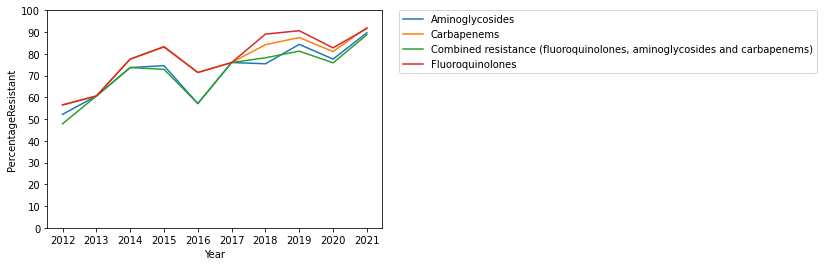

In [10]:
organism="Acinetobacter spp."
regionname="Cyprus"
temp_df=amr_df.query("Organism==@organism and RegionName==@regionname")

sns.lineplot(x="Year", y="PercentageResistant",hue='AntimicrobialGroup', data=temp_df, ci=None)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.gca().set_ylim(0, 100)
plt.gca().set_yticks(range(0, 101, 10))
#Set x ticks to only show years
plt.xticks(range(min(temp_df['Year']), max(temp_df['Year'])+1));
  

# Loop to produce all plots
This technique was not demonstrated in the lecture, but it was used in last week's workshop notebook
Used here to give quick access to all graphs

Acinetobacter spp. Austria


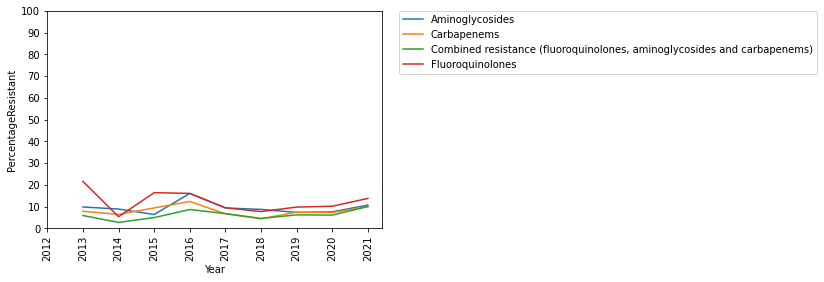

Acinetobacter spp. Belgium


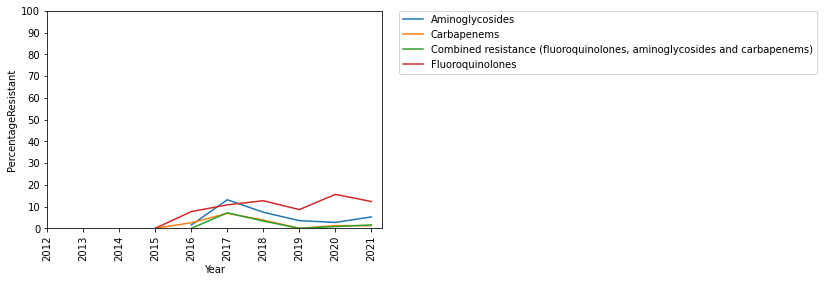

Acinetobacter spp. Bulgaria


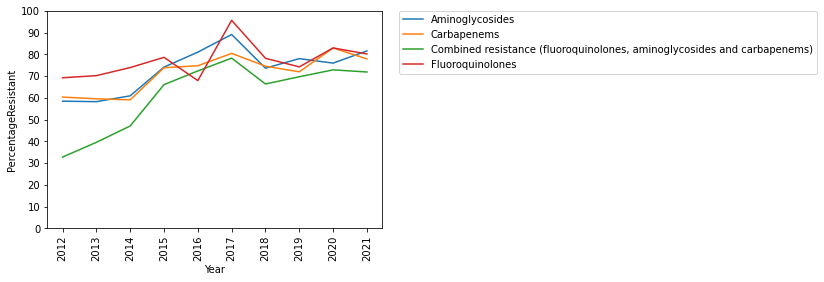

Acinetobacter spp. Cyprus


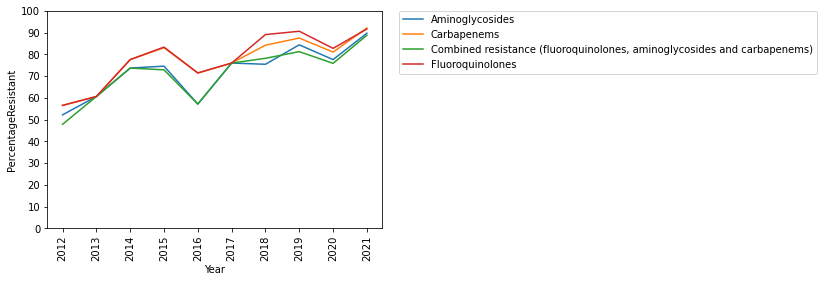

Acinetobacter spp. Czechia


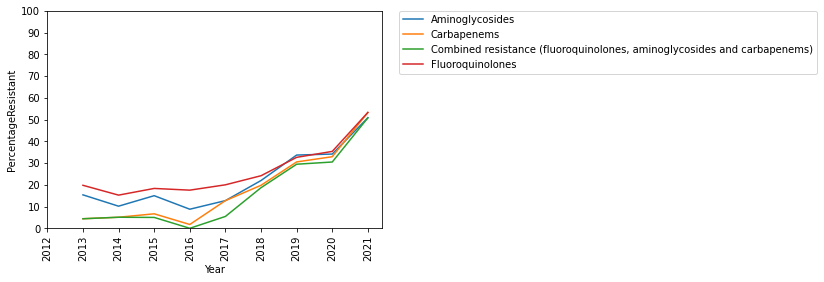

Acinetobacter spp. Germany


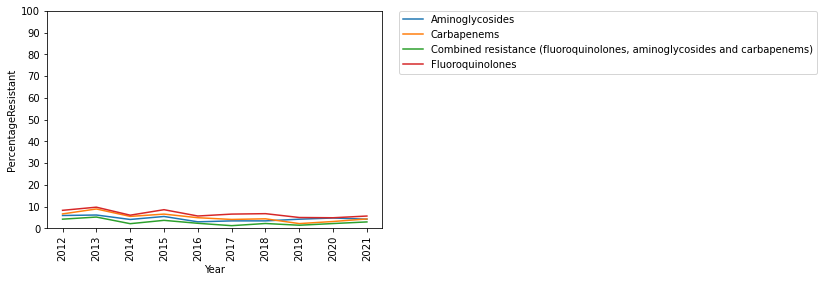

Acinetobacter spp. Denmark


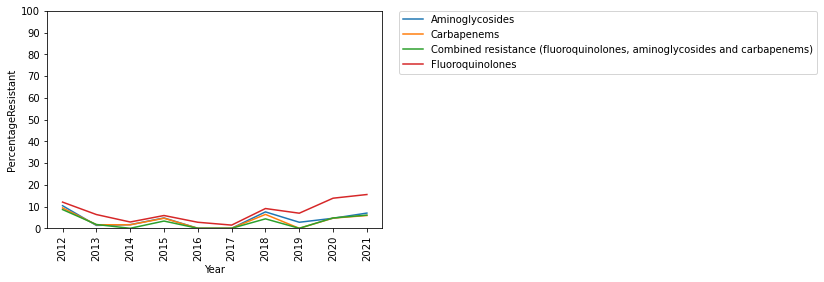

Acinetobacter spp. Estonia


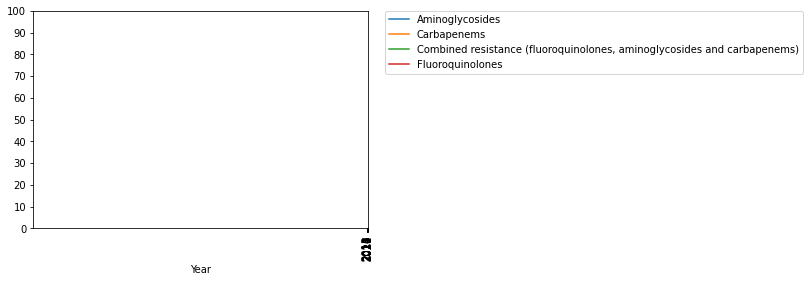

Acinetobacter spp. Greece


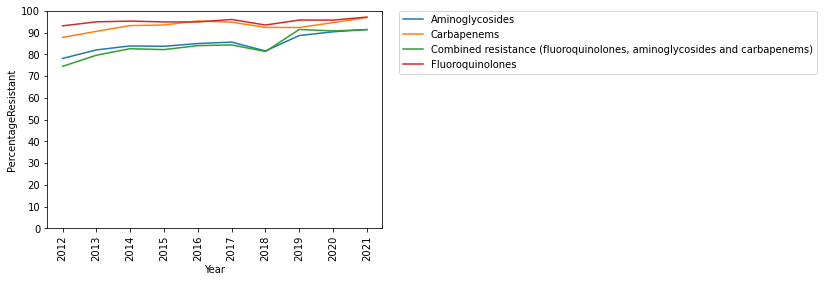

Acinetobacter spp. Spain


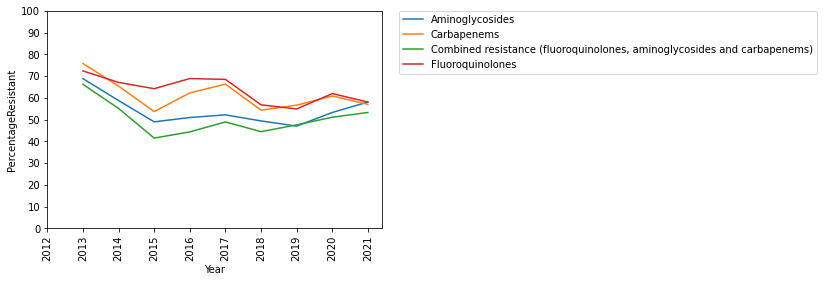

Acinetobacter spp. Finland


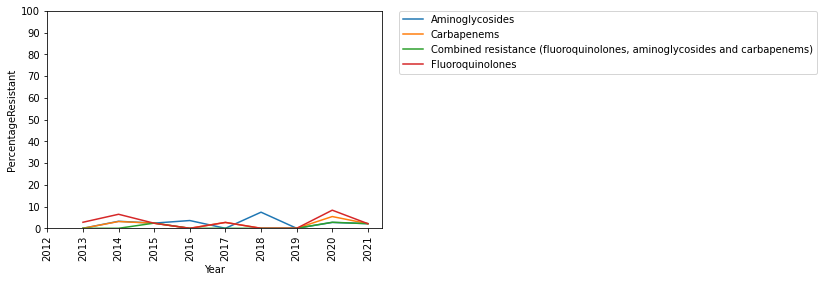

Acinetobacter spp. France


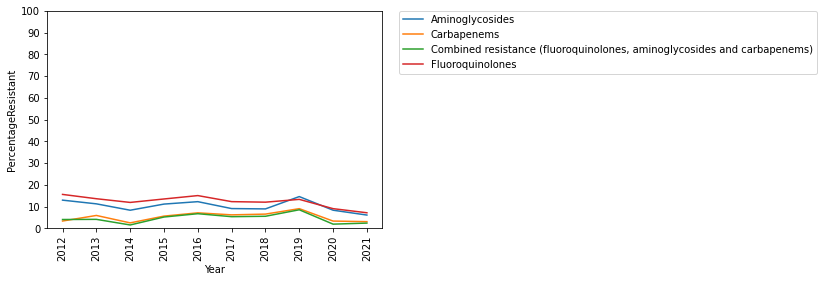

Acinetobacter spp. Croatia


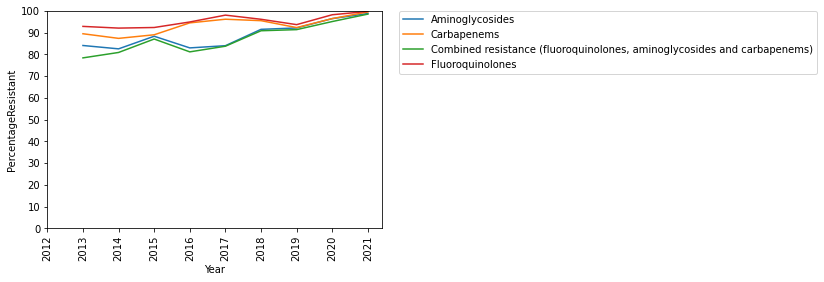

Acinetobacter spp. Hungary


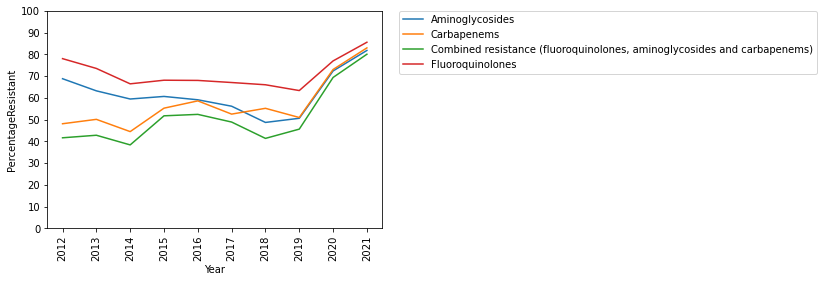

Acinetobacter spp. Ireland


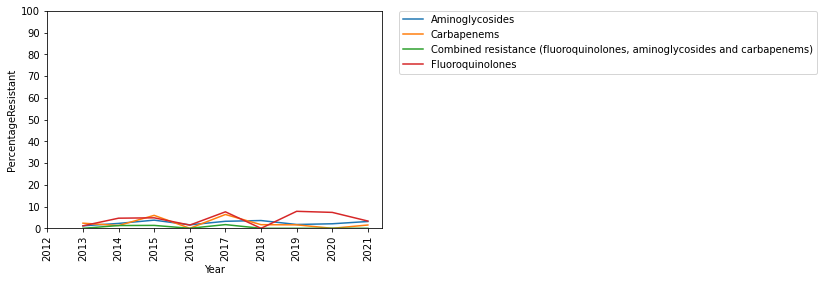

Acinetobacter spp. Iceland


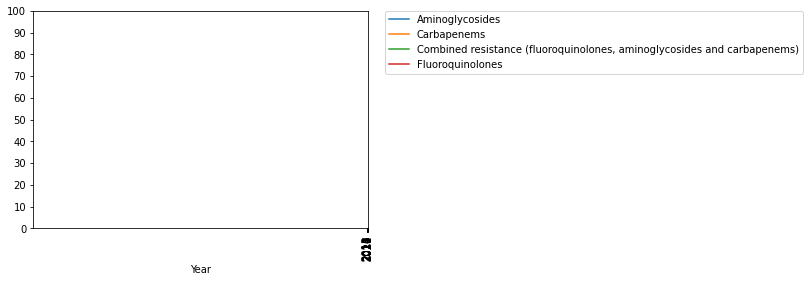

Acinetobacter spp. Italy


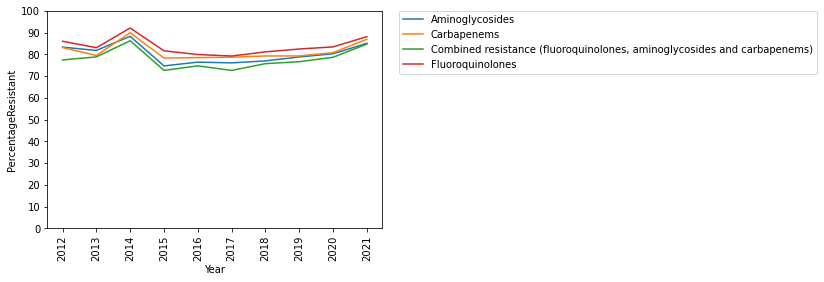

Acinetobacter spp. Lithuania


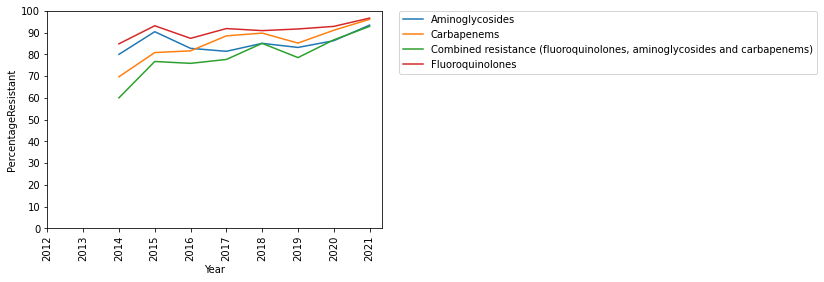

Acinetobacter spp. Luxembourg


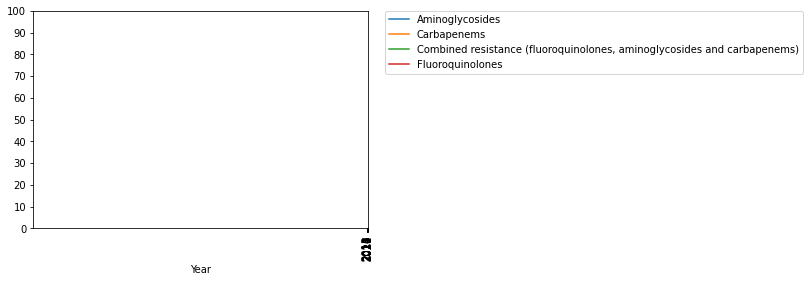

Acinetobacter spp. Latvia


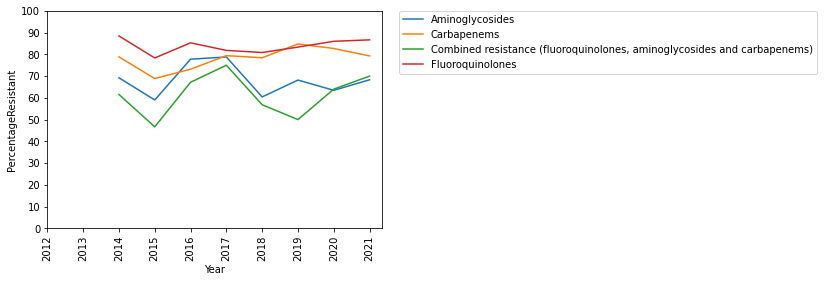

Acinetobacter spp. Malta


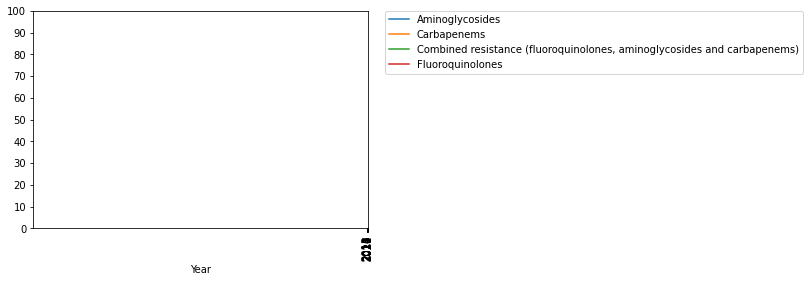

Acinetobacter spp. Netherlands


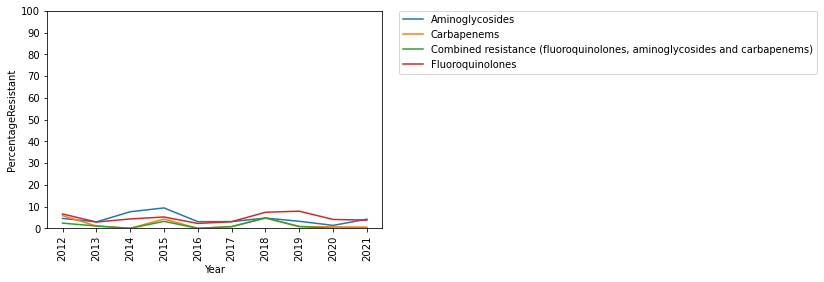

Acinetobacter spp. Norway


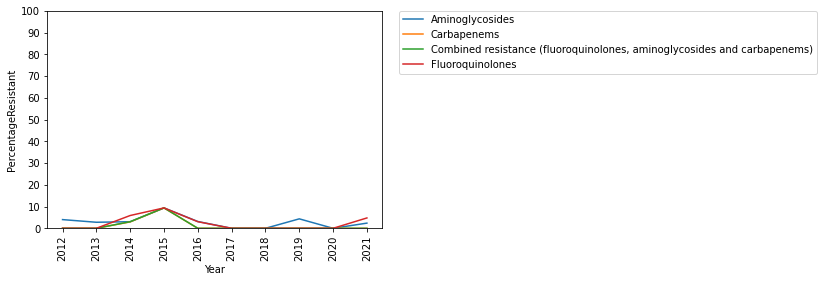

Acinetobacter spp. Poland


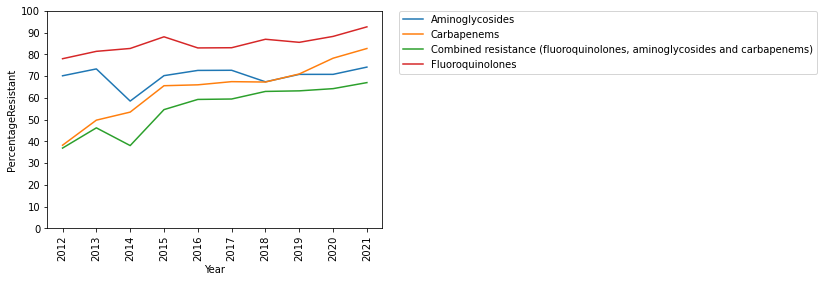

Acinetobacter spp. Portugal


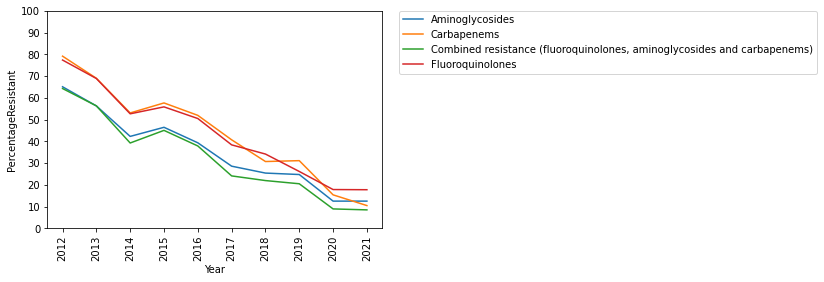

Acinetobacter spp. Romania


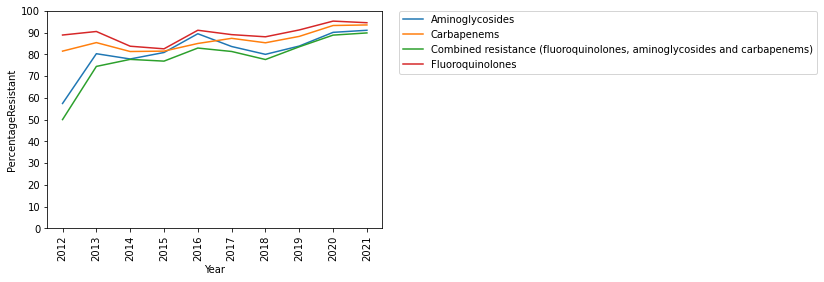

Acinetobacter spp. Sweden


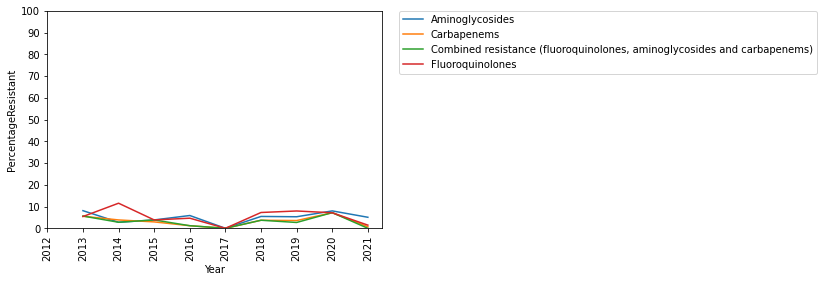

Acinetobacter spp. Slovenia


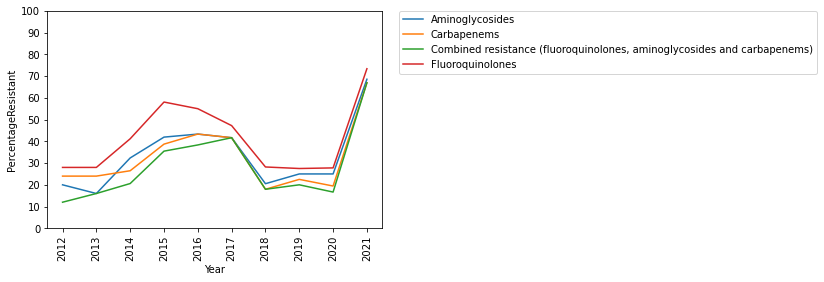

Acinetobacter spp. Slovakia


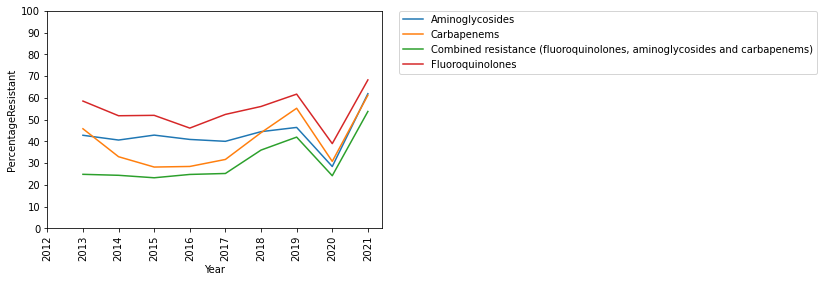

Acinetobacter spp. United Kingdom


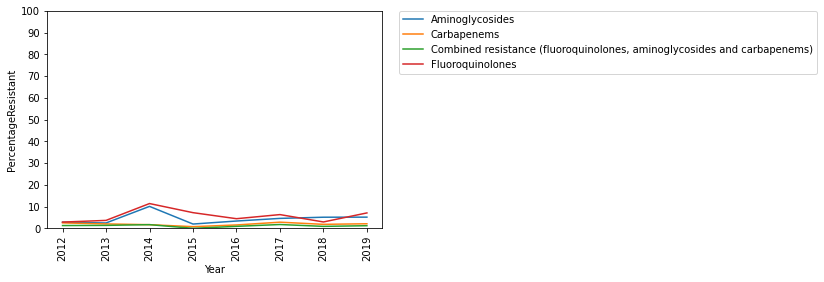

Enterococcus faecalis Austria


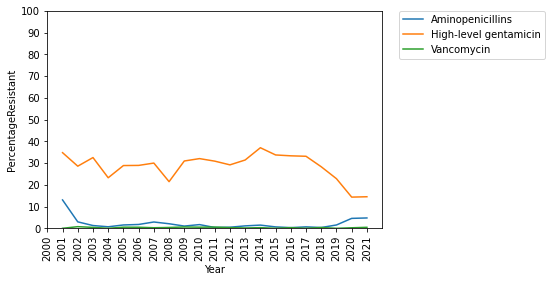

Enterococcus faecalis Belgium


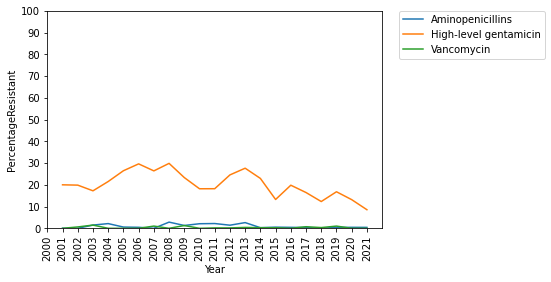

Enterococcus faecalis Bulgaria


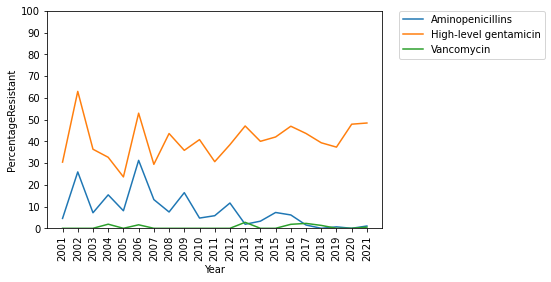

Enterococcus faecalis Cyprus


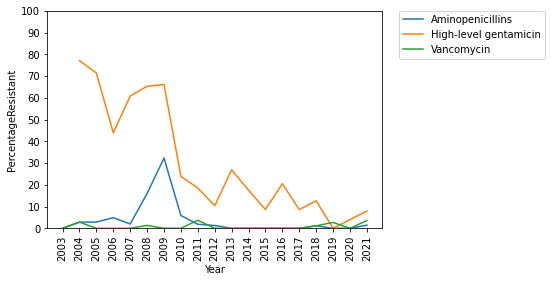

Enterococcus faecalis Czechia


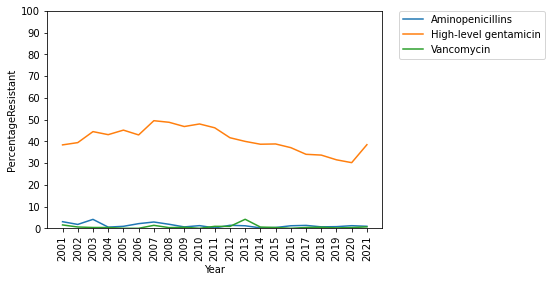

Enterococcus faecalis Germany


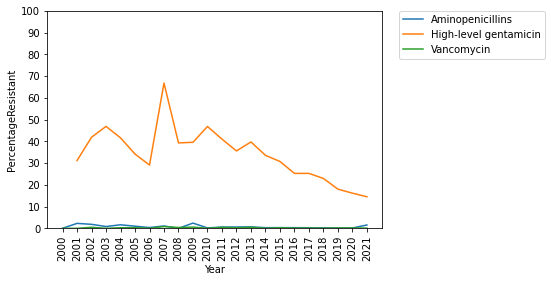

Enterococcus faecalis Denmark


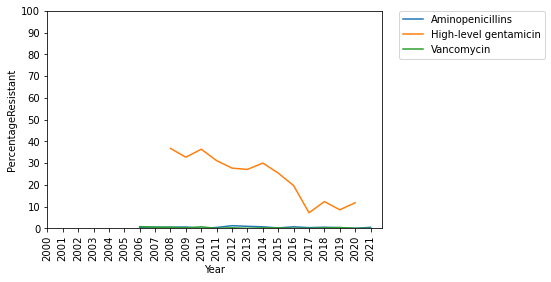

Enterococcus faecalis Estonia


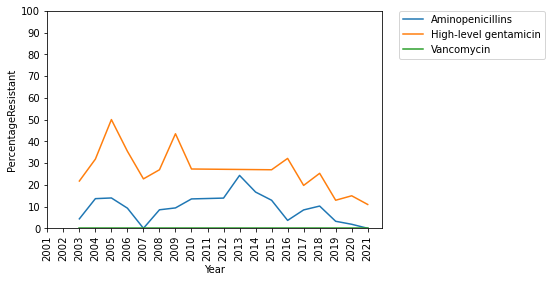

Enterococcus faecalis Greece


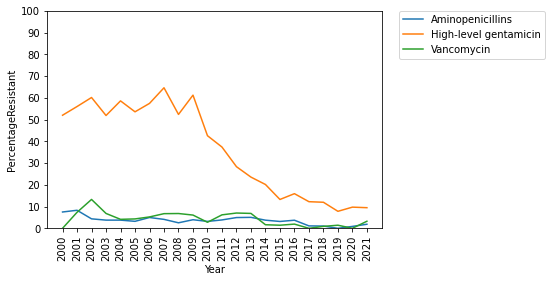

Enterococcus faecalis Spain


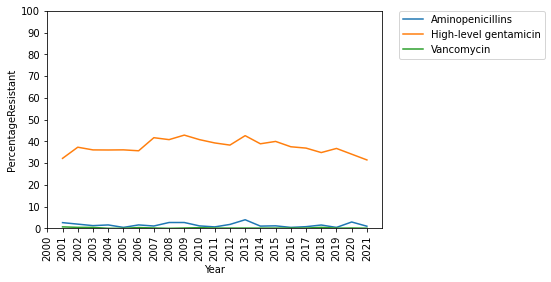

Enterococcus faecalis Finland


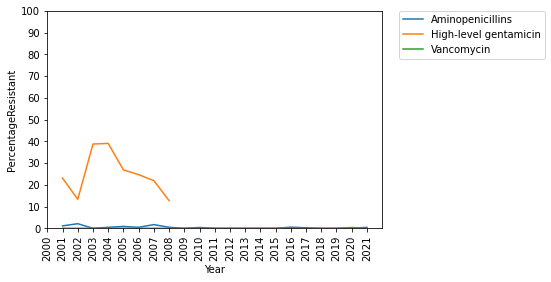

Enterococcus faecalis France


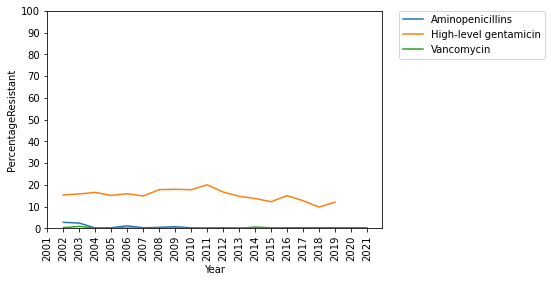

Enterococcus faecalis Croatia


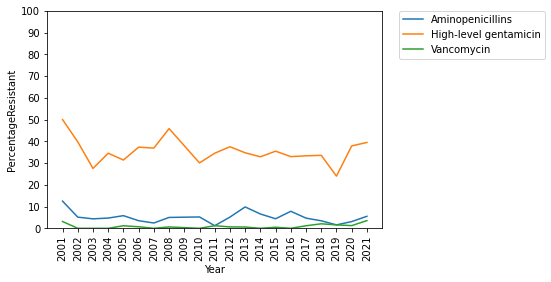

Enterococcus faecalis Hungary


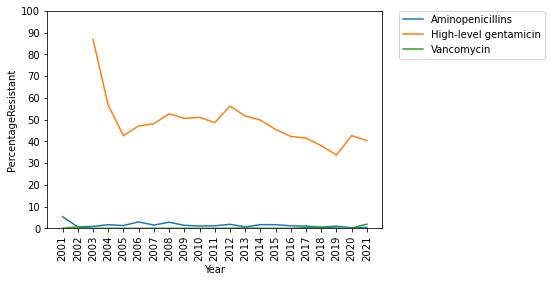

Enterococcus faecalis Ireland


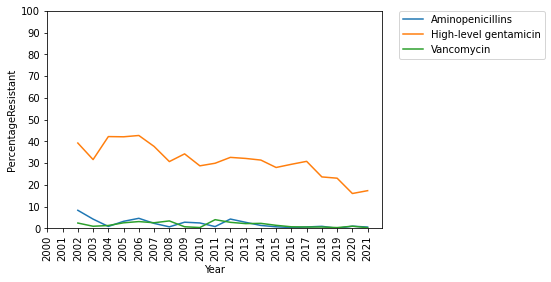

Enterococcus faecalis Iceland


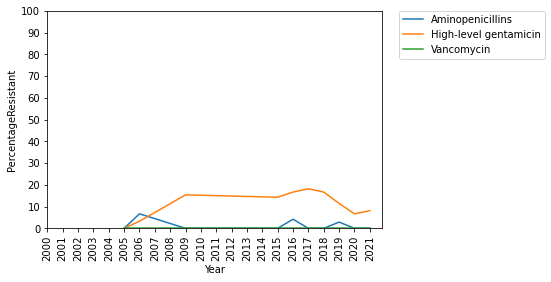

Enterococcus faecalis Italy


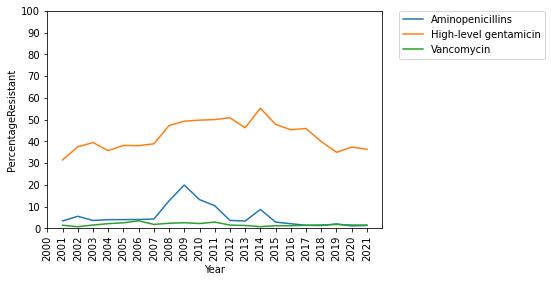

Enterococcus faecalis Lithuania


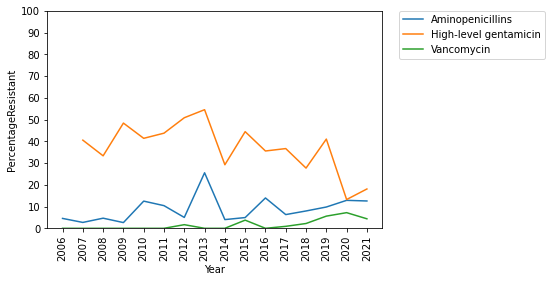

Enterococcus faecalis Luxembourg


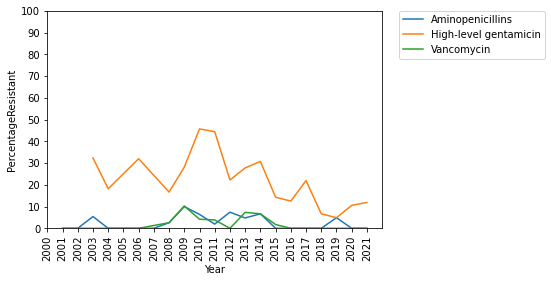

Enterococcus faecalis Latvia


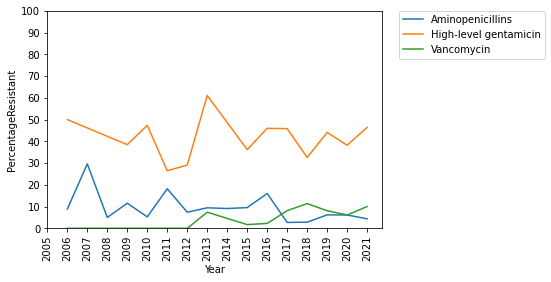

Enterococcus faecalis Malta


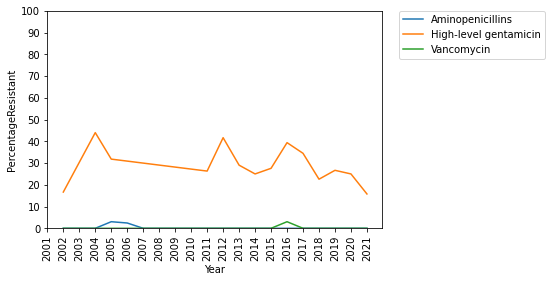

Enterococcus faecalis Netherlands


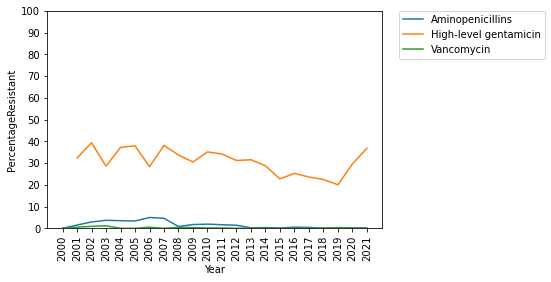

Enterococcus faecalis Norway


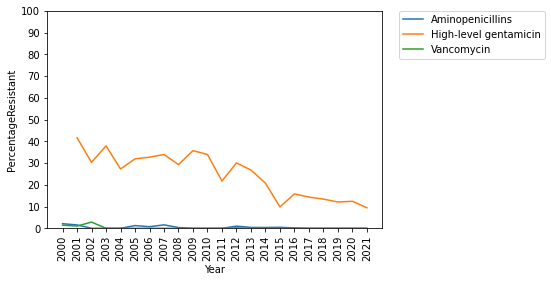

Enterococcus faecalis Poland


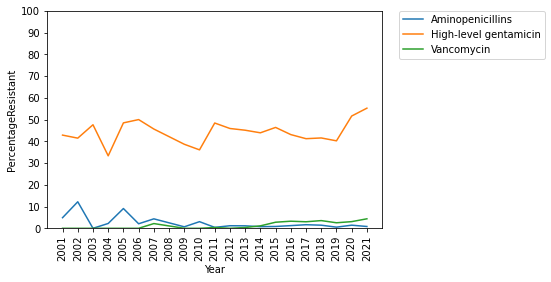

Enterococcus faecalis Portugal


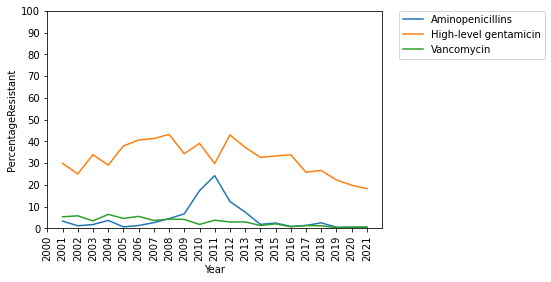

Enterococcus faecalis Romania


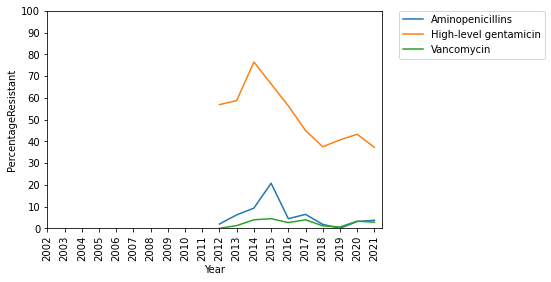

Enterococcus faecalis Sweden


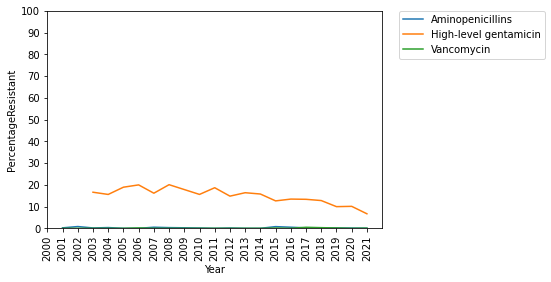

Enterococcus faecalis Slovenia


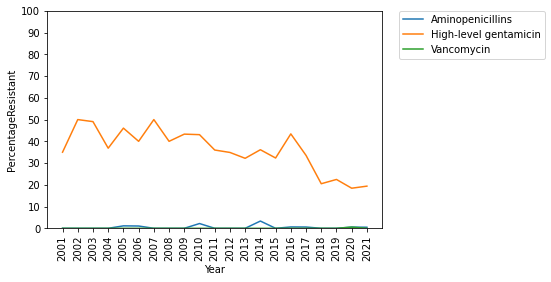

Enterococcus faecalis Slovakia


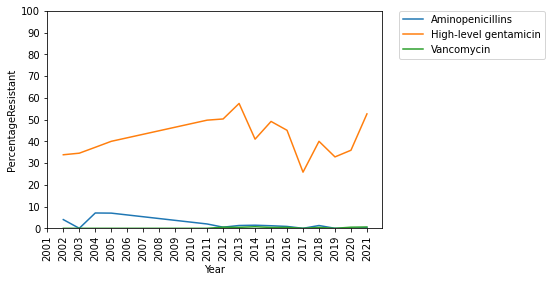

Enterococcus faecalis United Kingdom


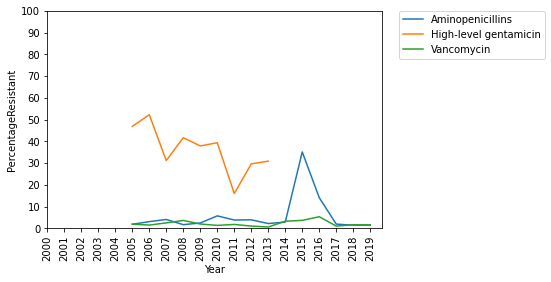

Enterococcus faecium Austria


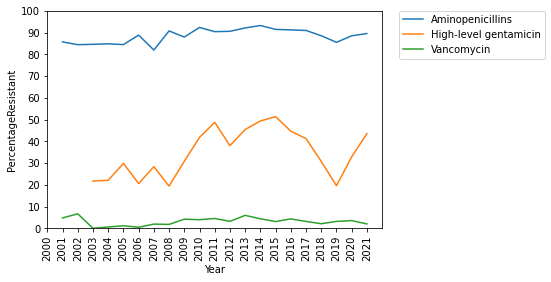

Enterococcus faecium Belgium


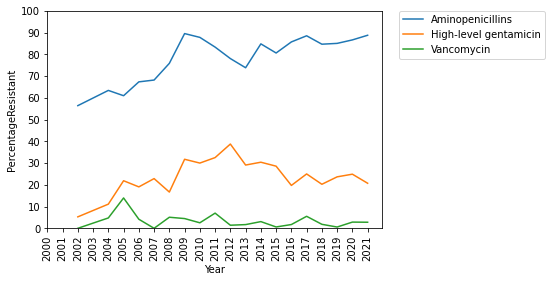

Enterococcus faecium Bulgaria


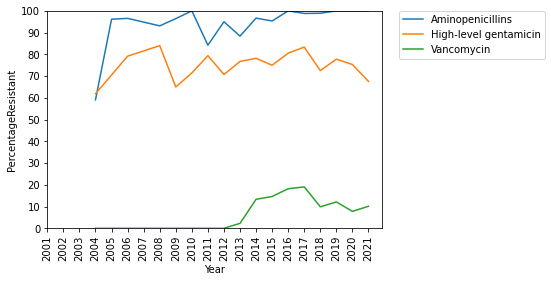

Enterococcus faecium Cyprus


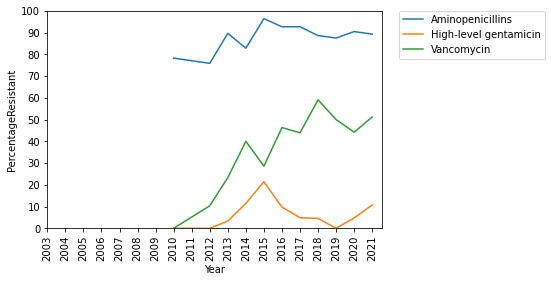

Enterococcus faecium Czechia


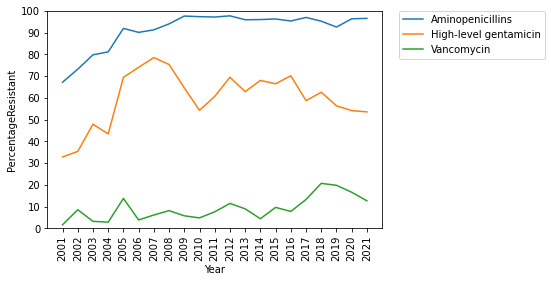

Enterococcus faecium Germany


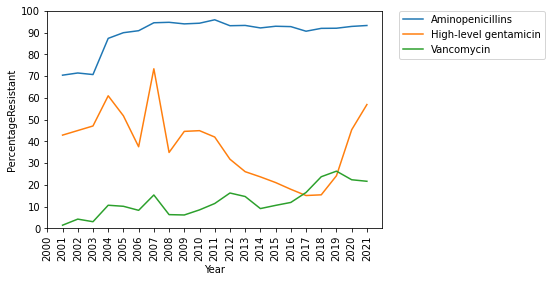

Enterococcus faecium Denmark


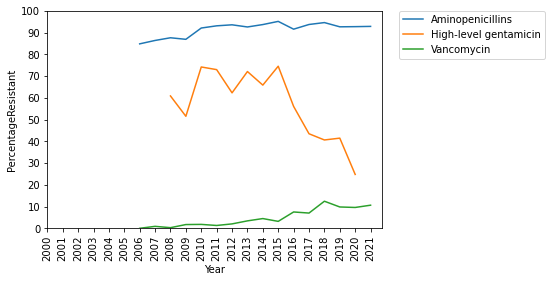

Enterococcus faecium Estonia


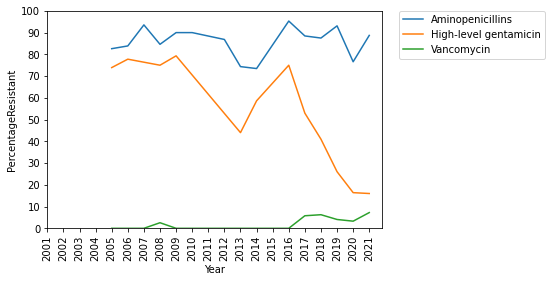

Enterococcus faecium Greece


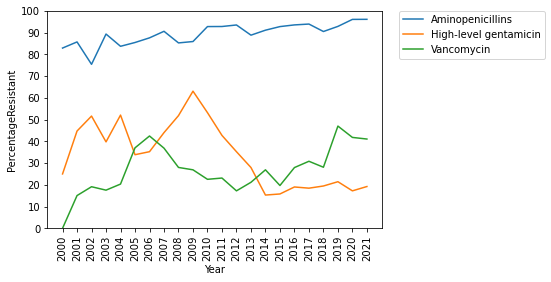

Enterococcus faecium Spain


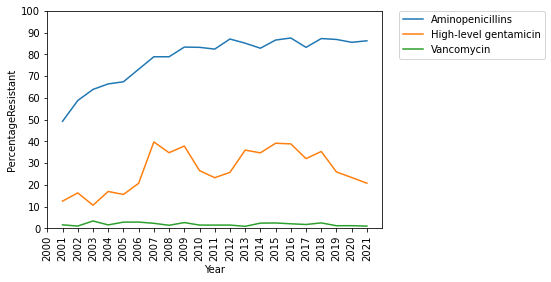

Enterococcus faecium Finland


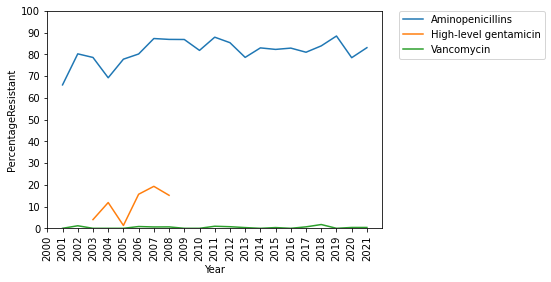

Enterococcus faecium France


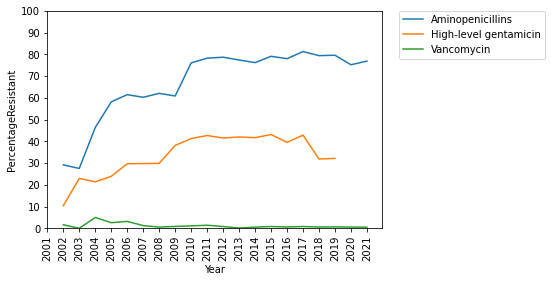

Enterococcus faecium Croatia


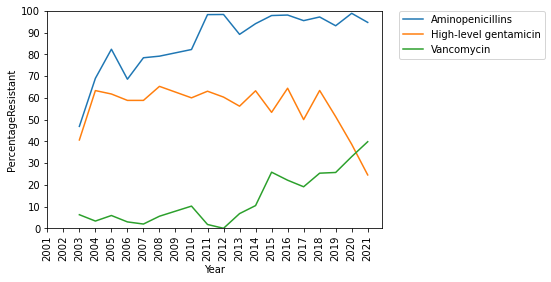

Enterococcus faecium Hungary


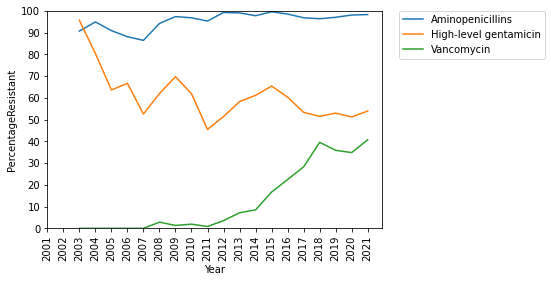

Enterococcus faecium Ireland


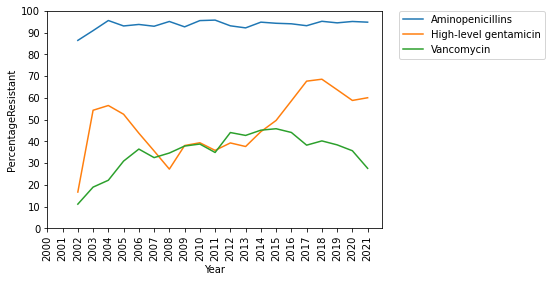

Enterococcus faecium Iceland


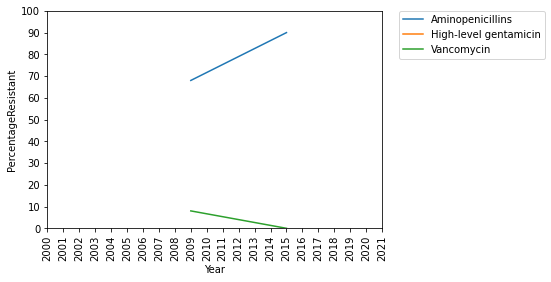

Enterococcus faecium Italy


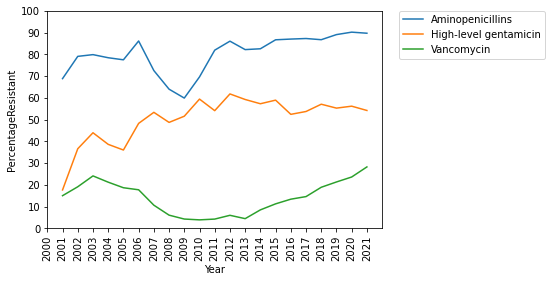

Enterococcus faecium Lithuania


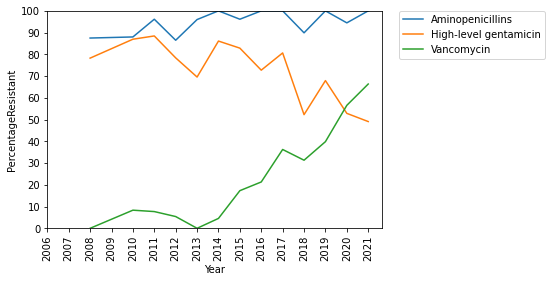

Enterococcus faecium Luxembourg


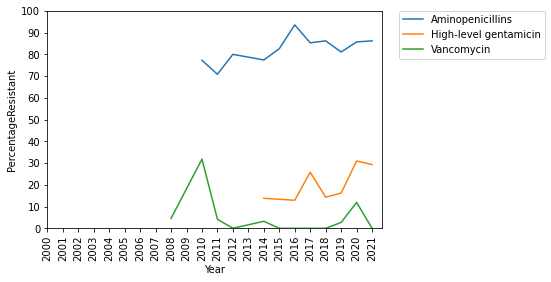

Enterococcus faecium Latvia


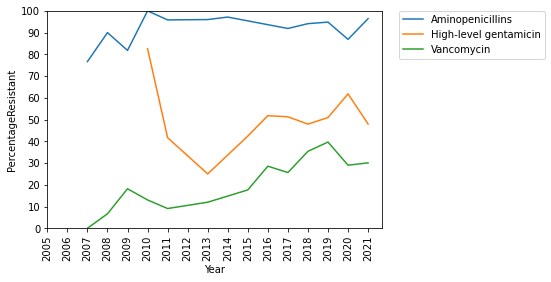

Enterococcus faecium Malta


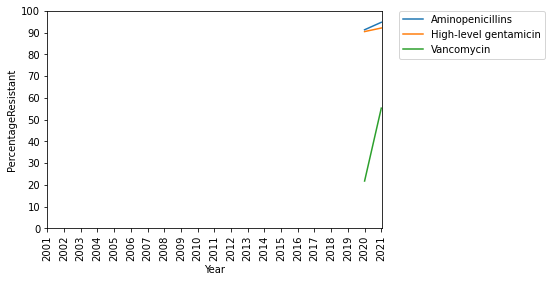

Enterococcus faecium Netherlands


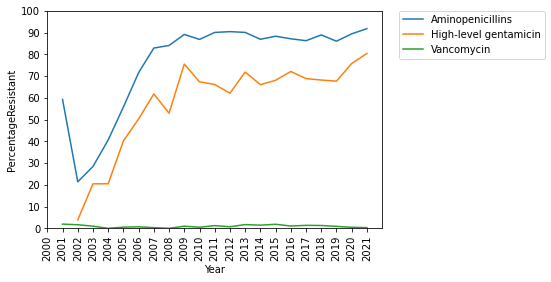

Enterococcus faecium Norway


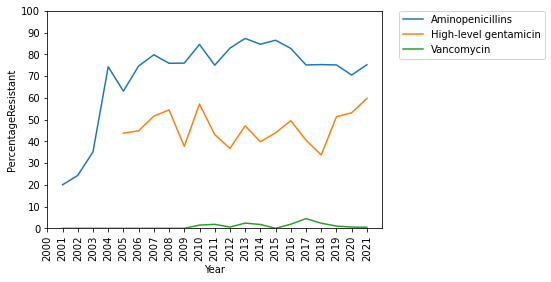

Enterococcus faecium Poland


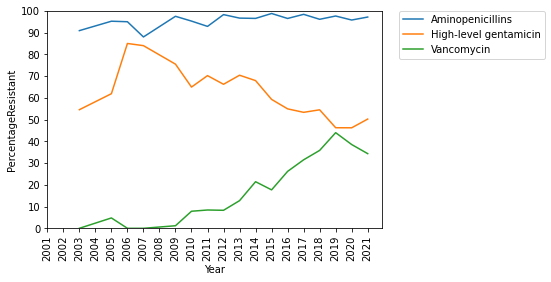

Enterococcus faecium Portugal


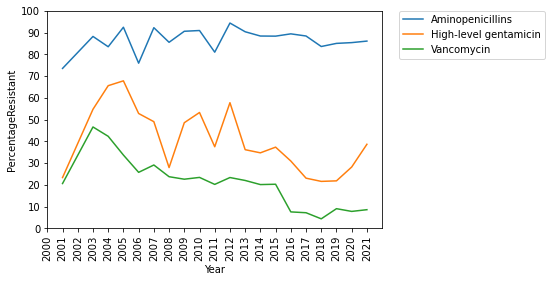

Enterococcus faecium Romania


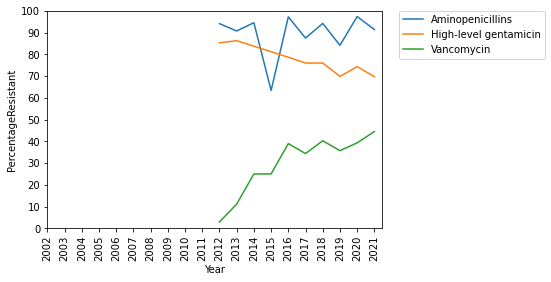

Enterococcus faecium Sweden


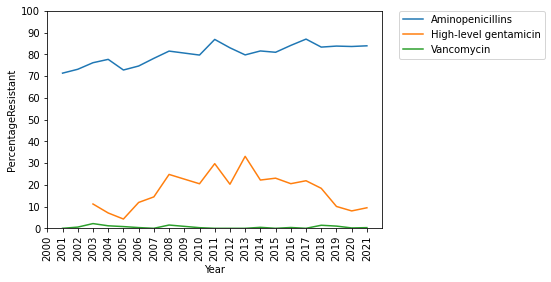

Enterococcus faecium Slovenia


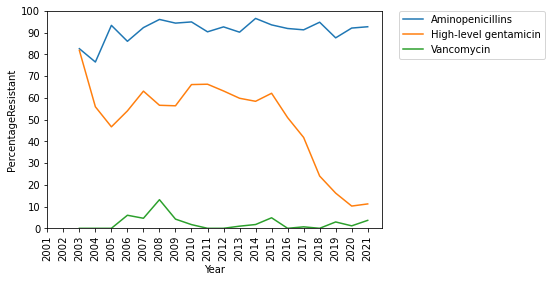

Enterococcus faecium Slovakia


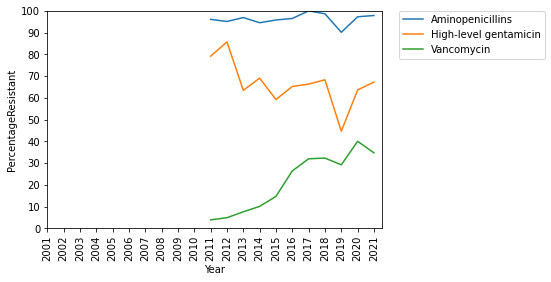

Enterococcus faecium United Kingdom


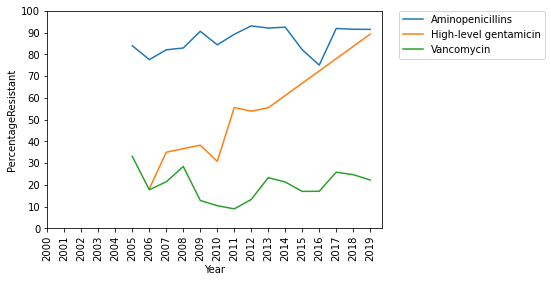

Escherichia coli Austria


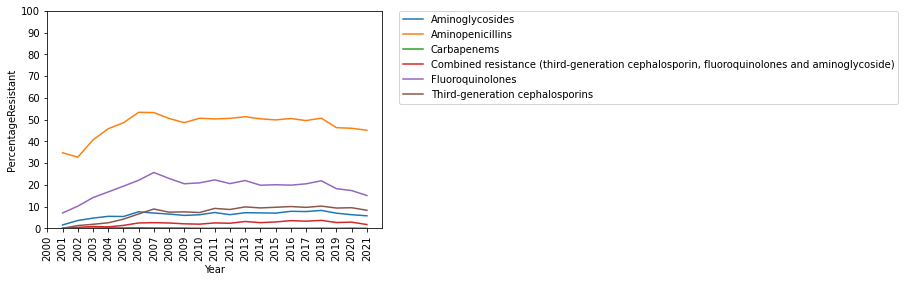

Escherichia coli Belgium


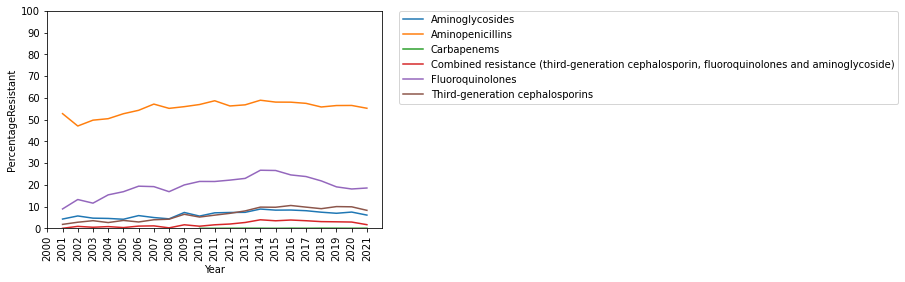

Escherichia coli Bulgaria


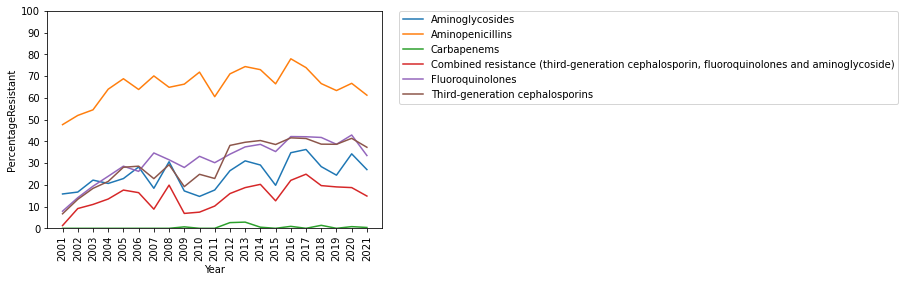

Escherichia coli Cyprus


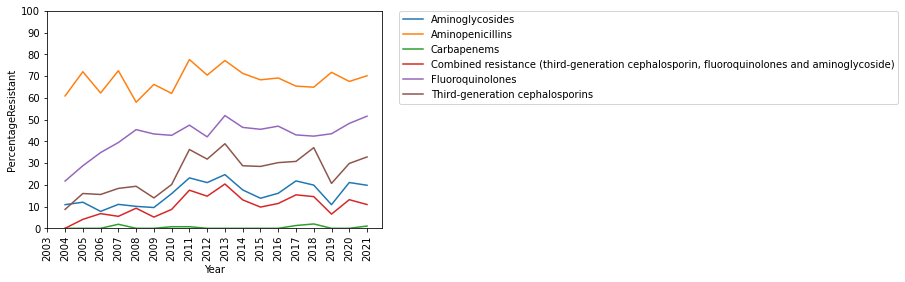

Escherichia coli Czechia


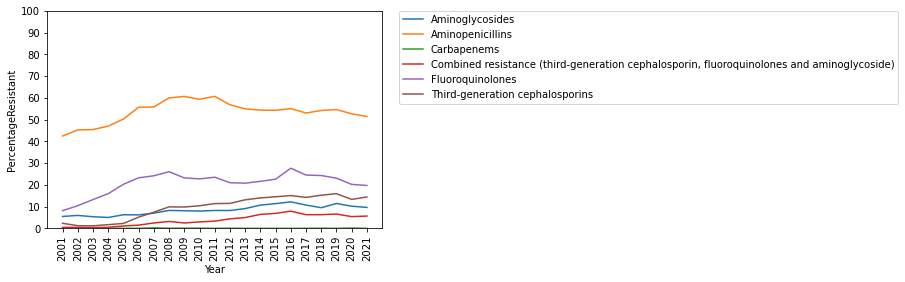

Escherichia coli Germany


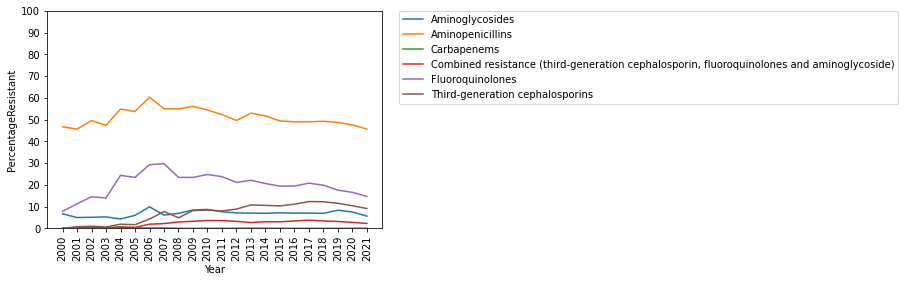

Escherichia coli Denmark


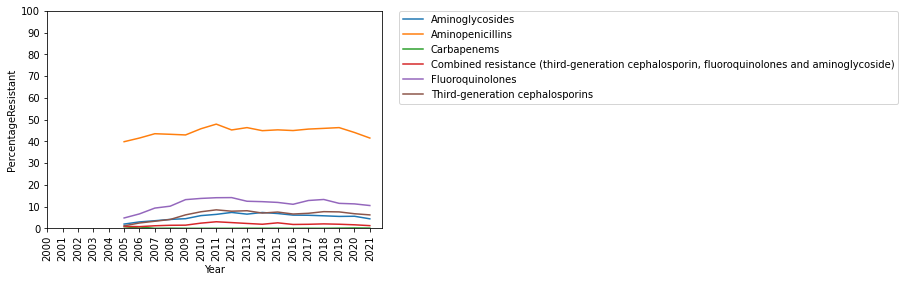

Escherichia coli Estonia


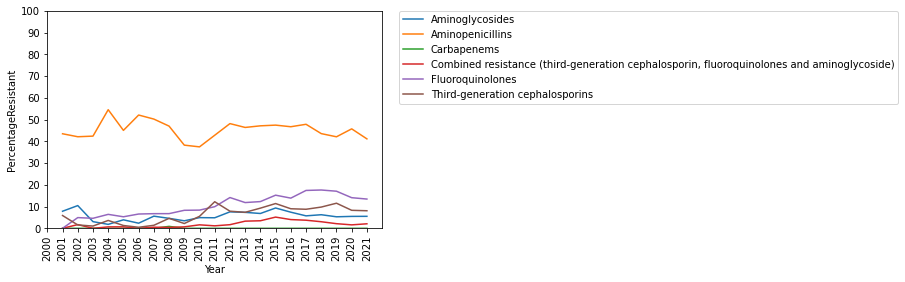

Escherichia coli Greece


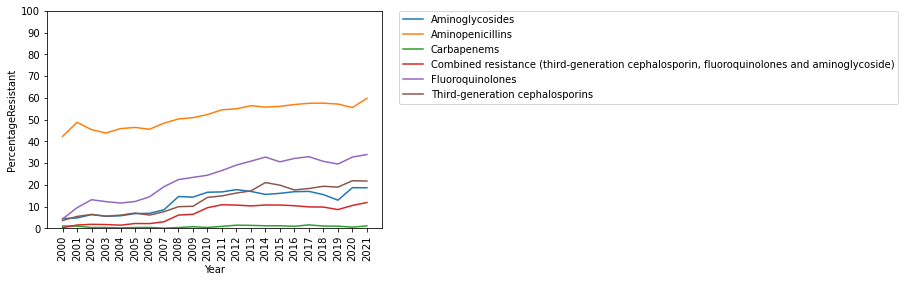

Escherichia coli Spain


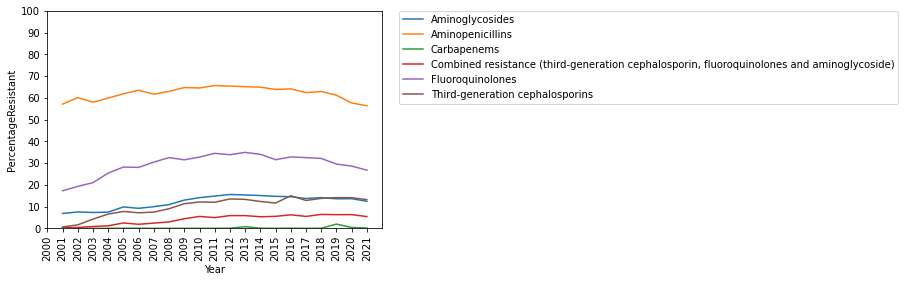

Escherichia coli Finland


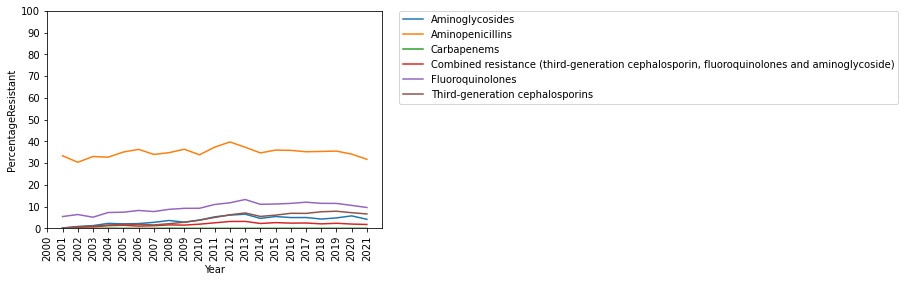

Escherichia coli France


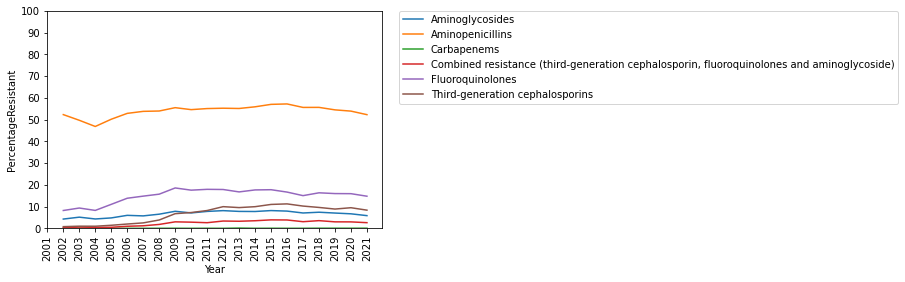

Escherichia coli Croatia


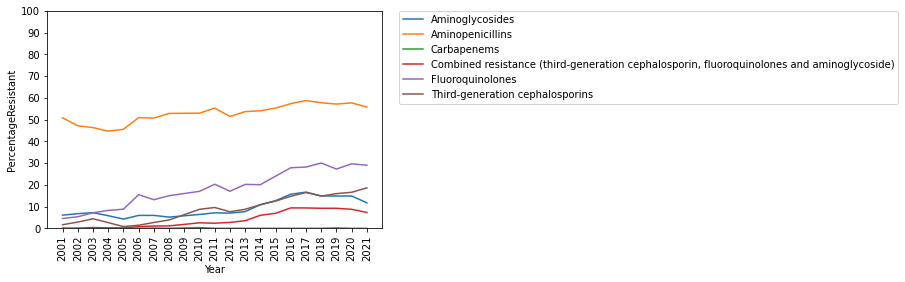

Escherichia coli Hungary


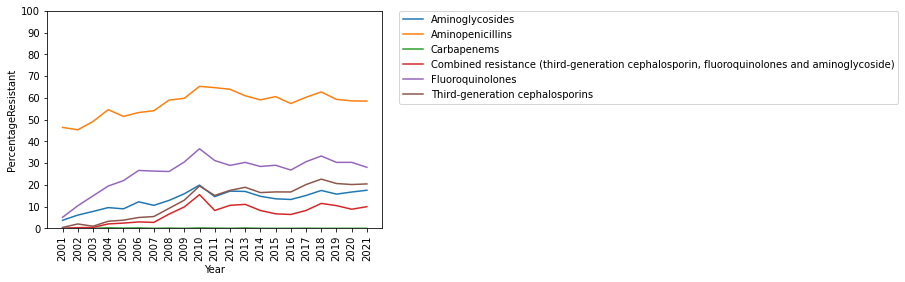

Escherichia coli Ireland


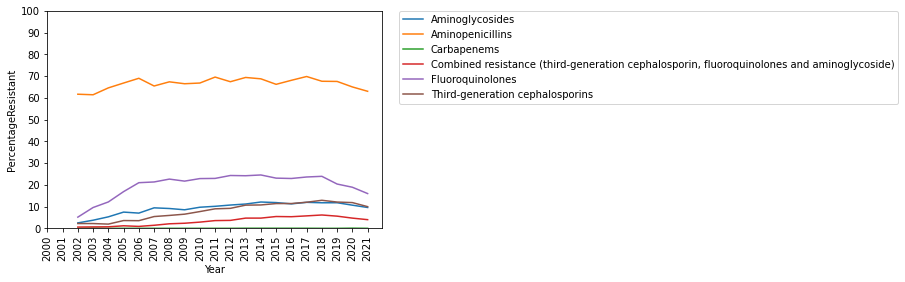

Escherichia coli Iceland


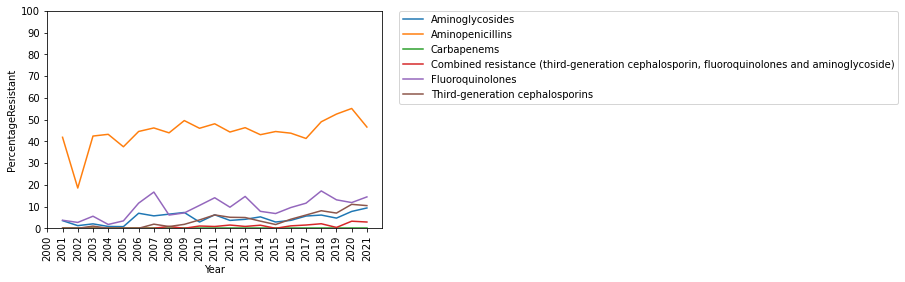

Escherichia coli Italy


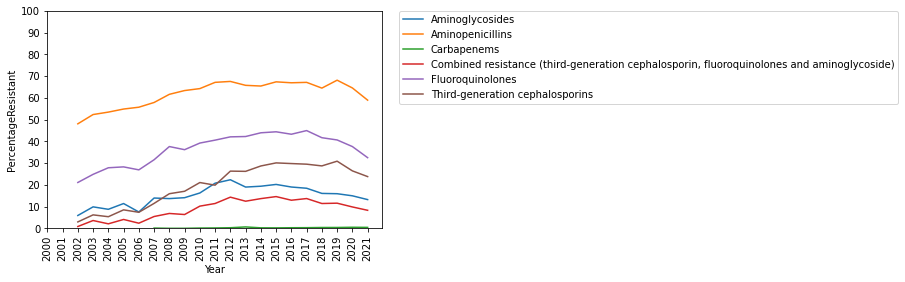

Escherichia coli Lithuania


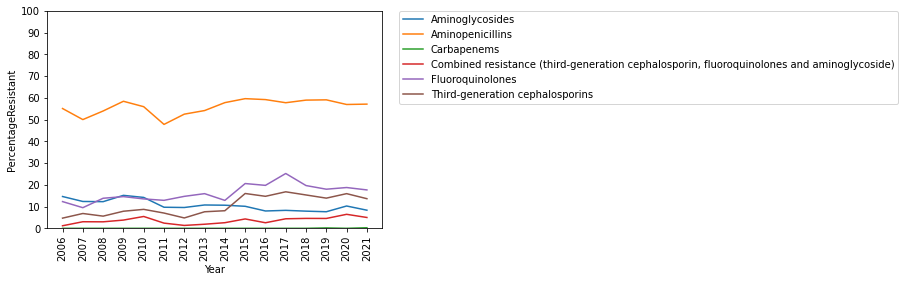

Escherichia coli Luxembourg


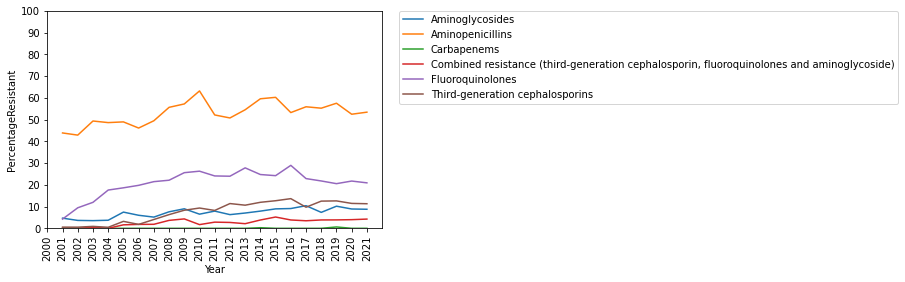

Escherichia coli Latvia


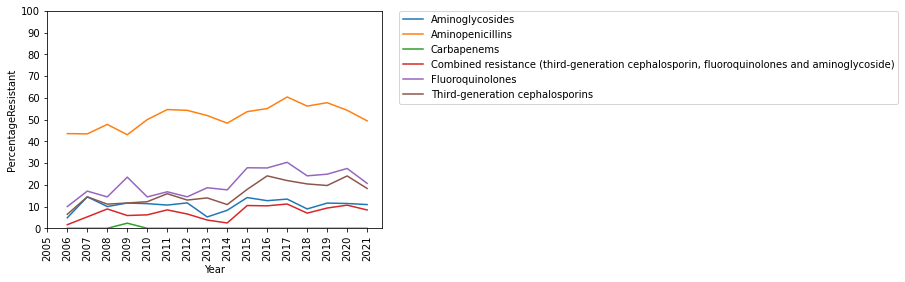

Escherichia coli Malta


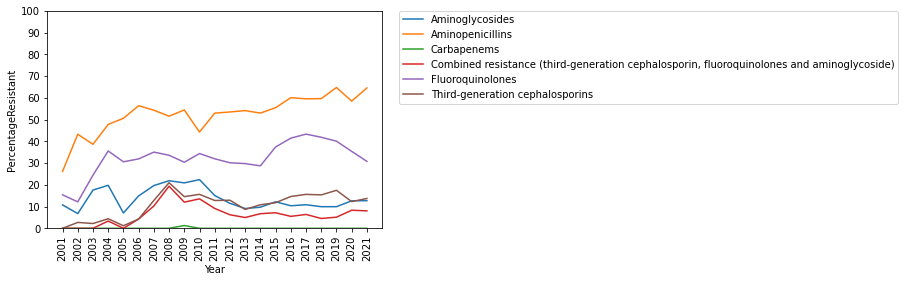

Escherichia coli Netherlands


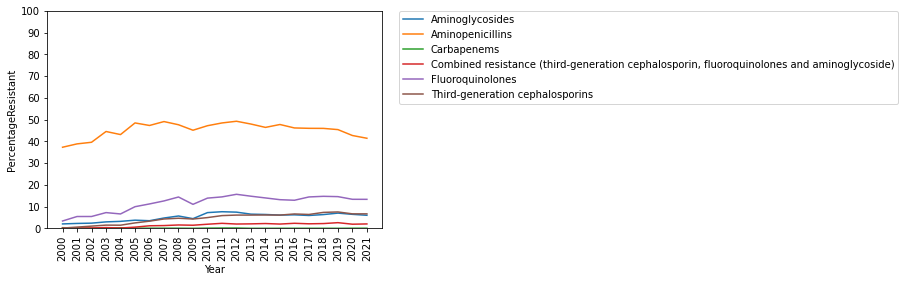

Escherichia coli Norway


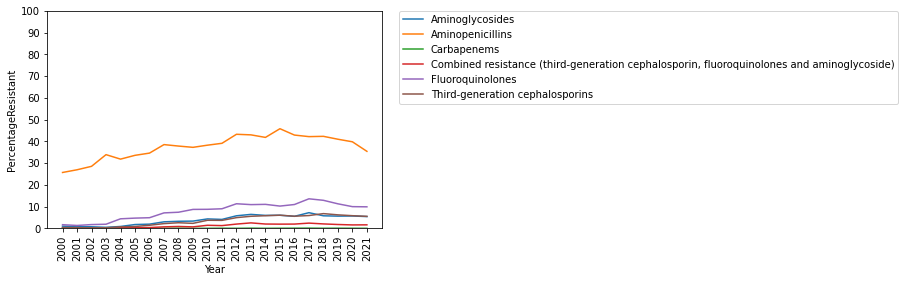

Escherichia coli Poland


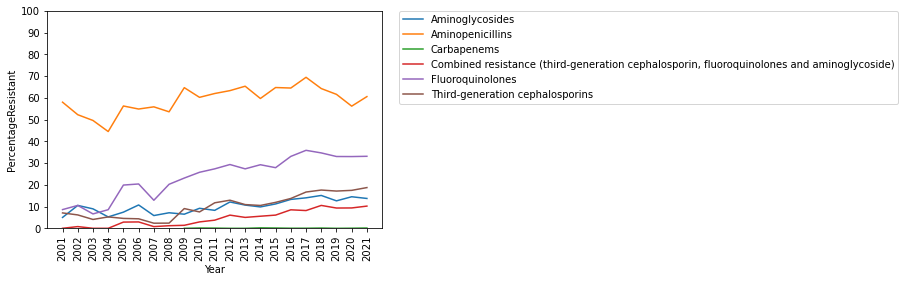

Escherichia coli Portugal


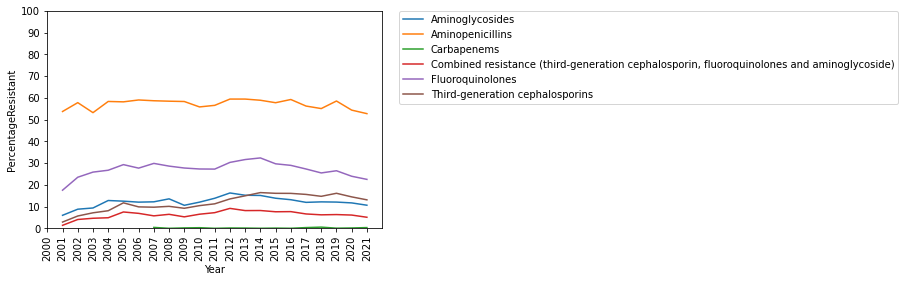

Escherichia coli Romania


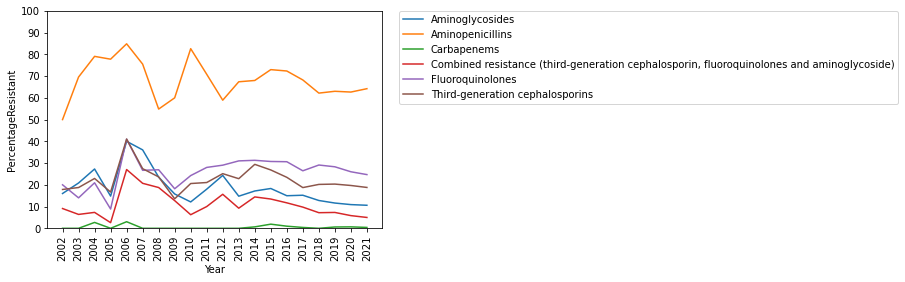

Escherichia coli Sweden


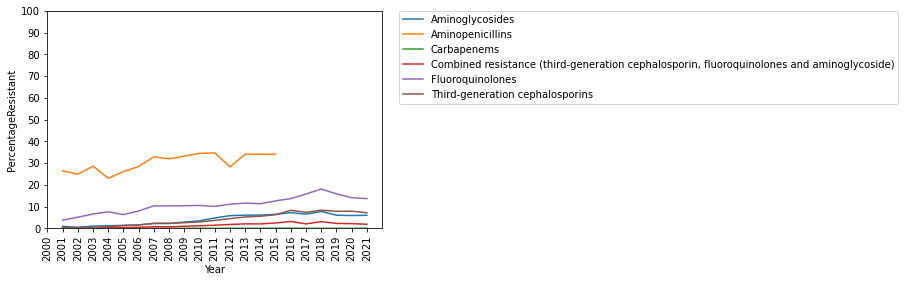

Escherichia coli Slovenia


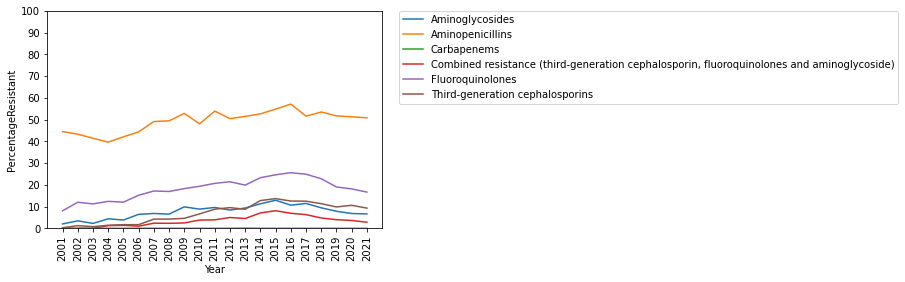

Escherichia coli Slovakia


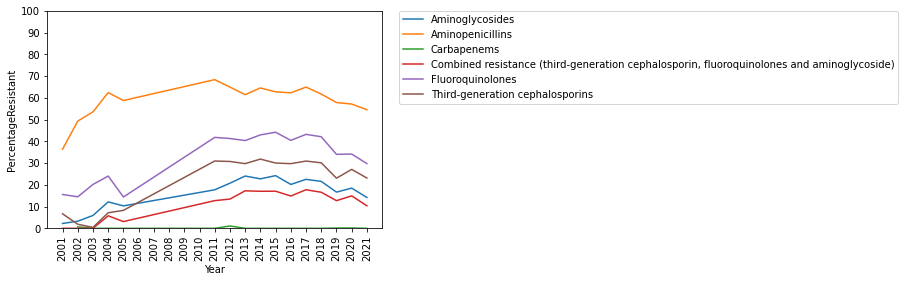

Escherichia coli United Kingdom


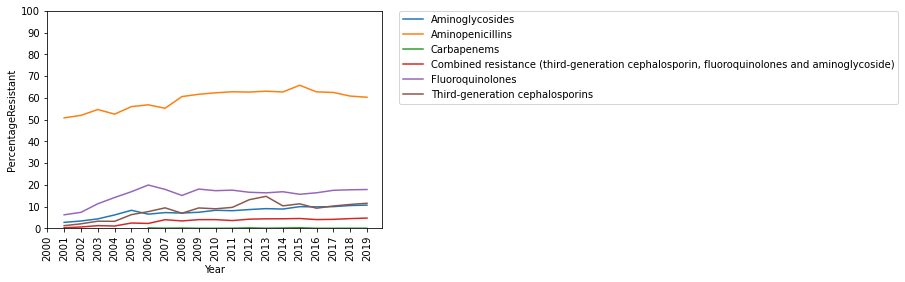

Klebsiella pneumoniae Austria


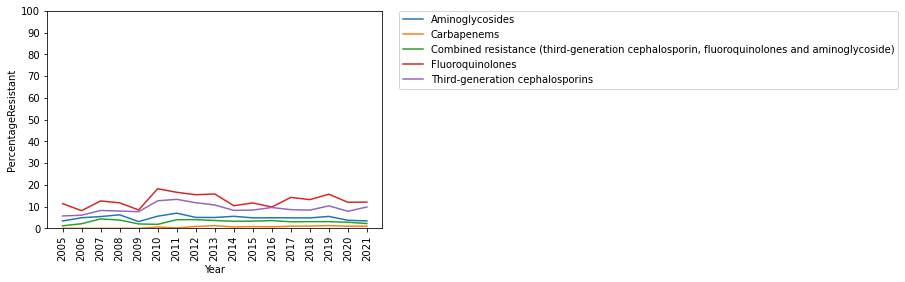

Klebsiella pneumoniae Belgium


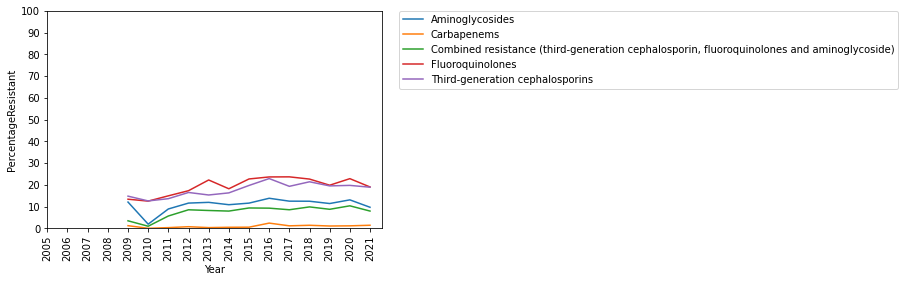

Klebsiella pneumoniae Bulgaria


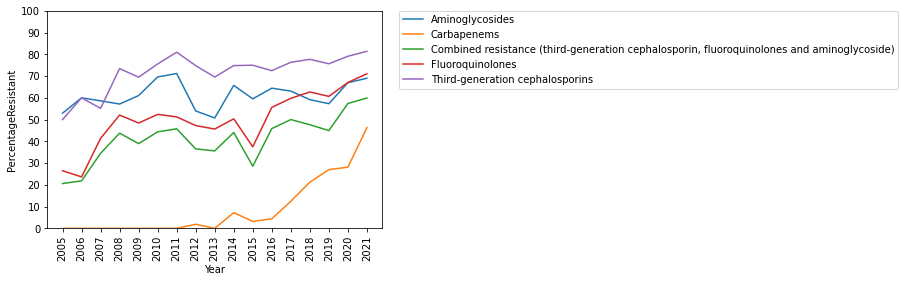

Klebsiella pneumoniae Cyprus


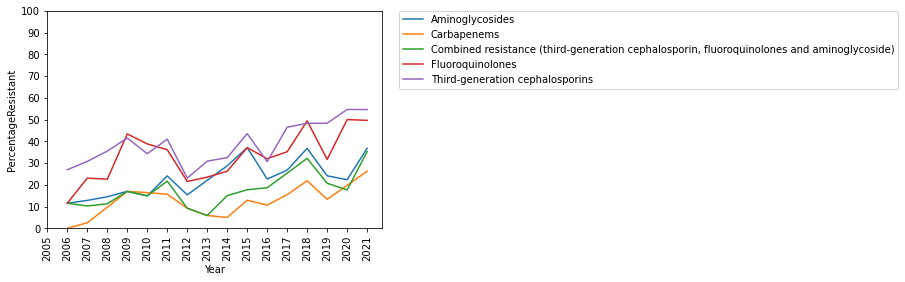

Klebsiella pneumoniae Czechia


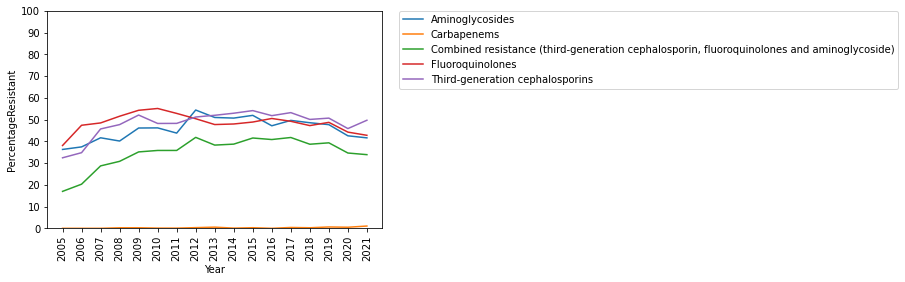

Klebsiella pneumoniae Germany


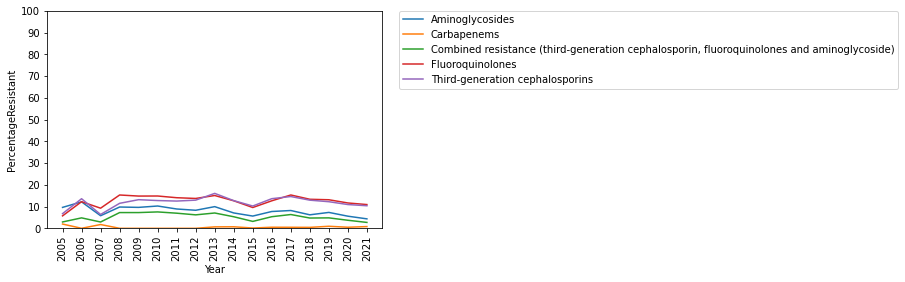

Klebsiella pneumoniae Denmark


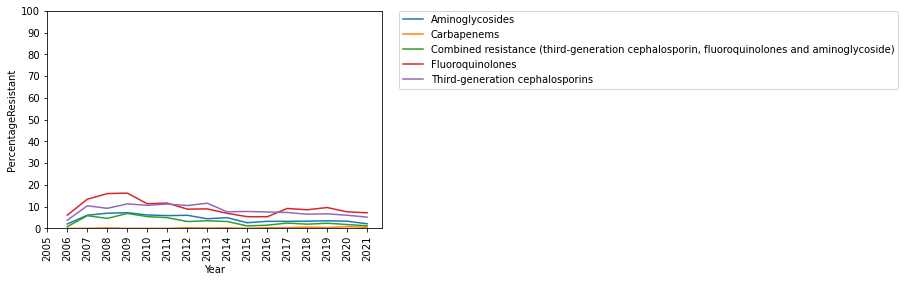

Klebsiella pneumoniae Estonia


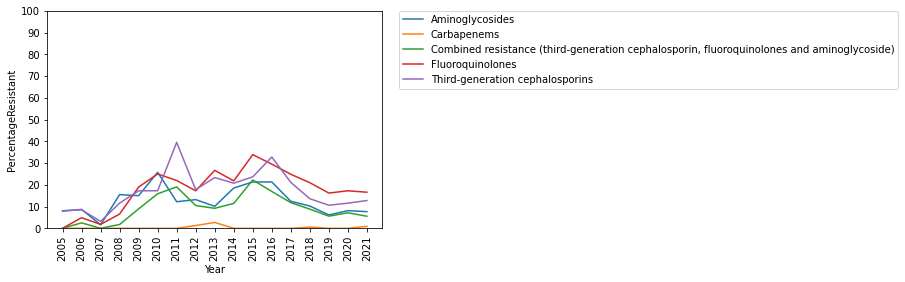

Klebsiella pneumoniae Greece


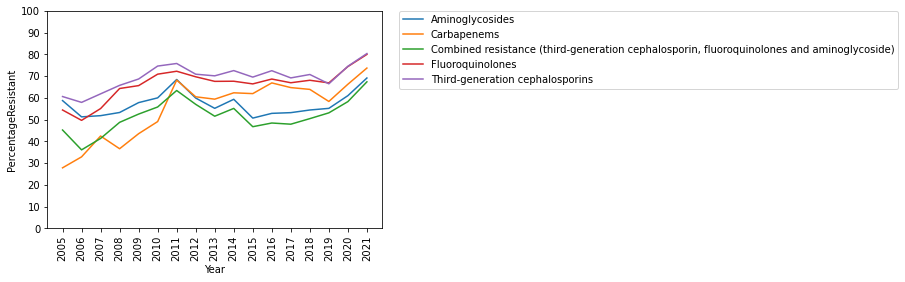

Klebsiella pneumoniae Spain


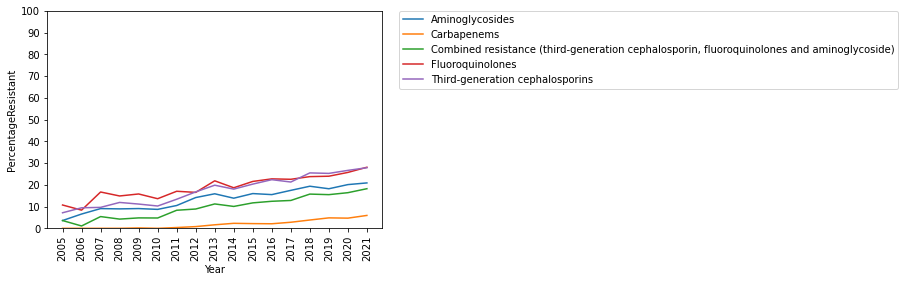

Klebsiella pneumoniae Finland


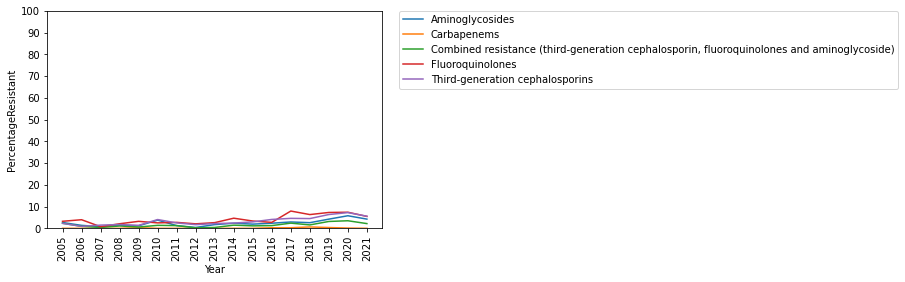

Klebsiella pneumoniae France


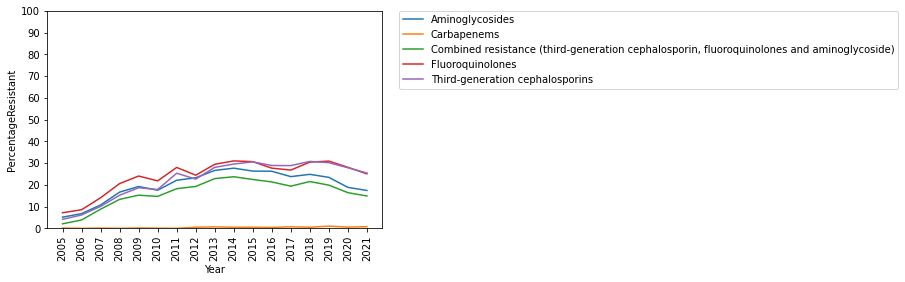

Klebsiella pneumoniae Croatia


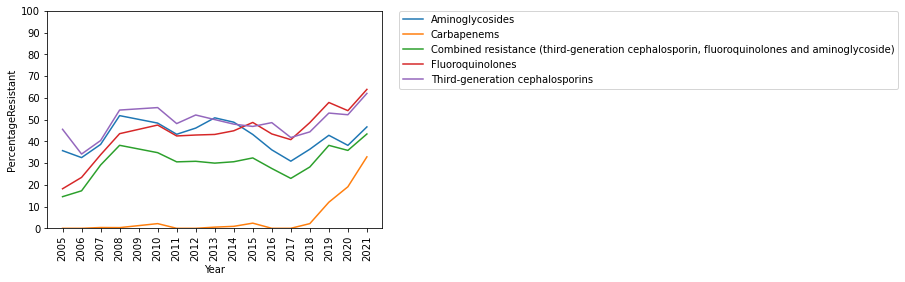

Klebsiella pneumoniae Hungary


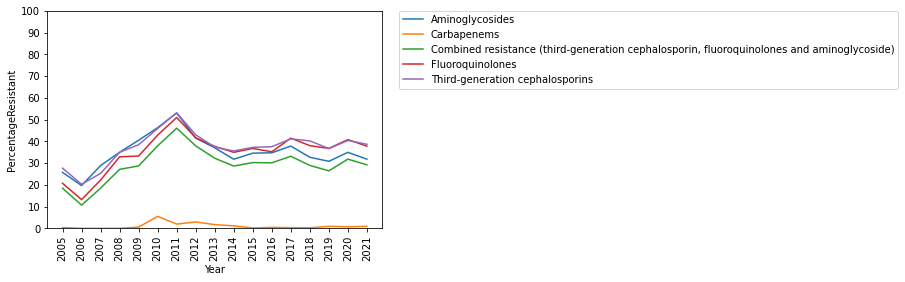

Klebsiella pneumoniae Ireland


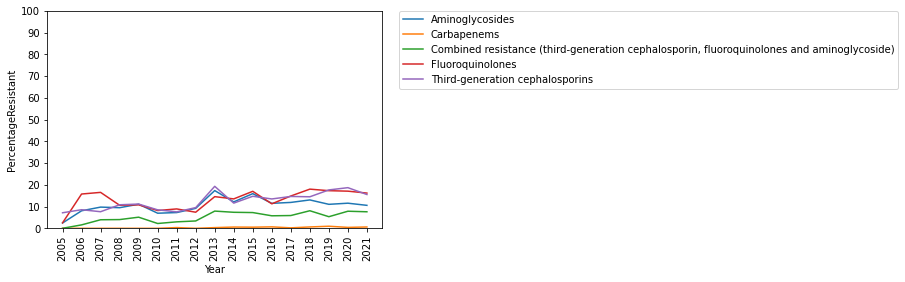

Klebsiella pneumoniae Iceland


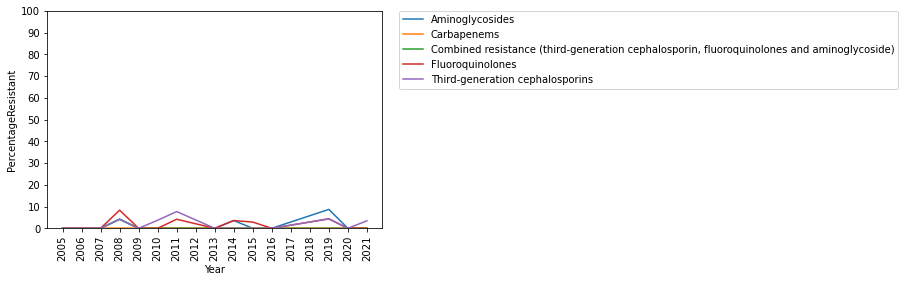

Klebsiella pneumoniae Italy


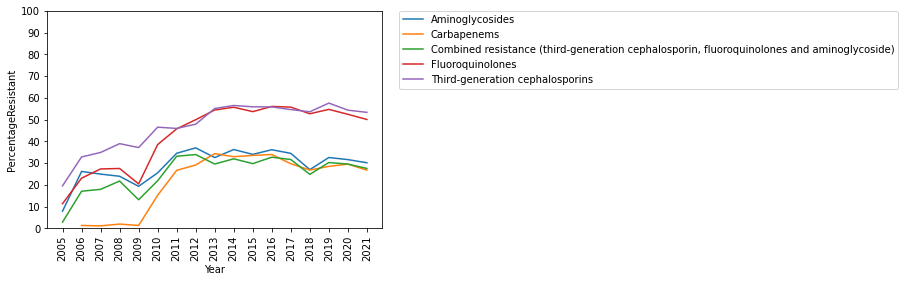

Klebsiella pneumoniae Lithuania


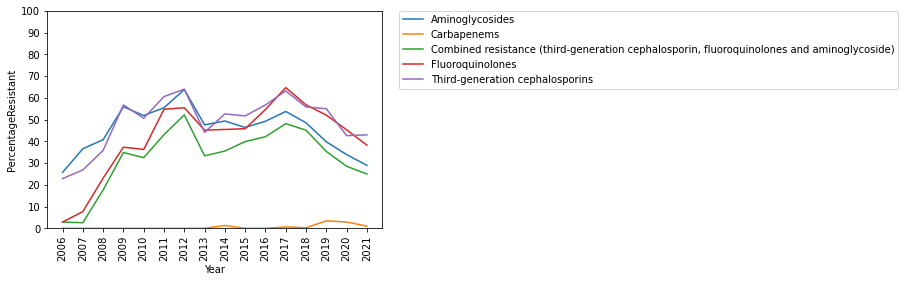

Klebsiella pneumoniae Luxembourg


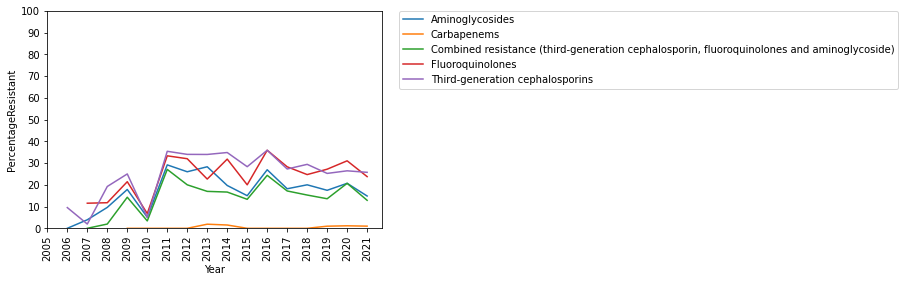

Klebsiella pneumoniae Latvia


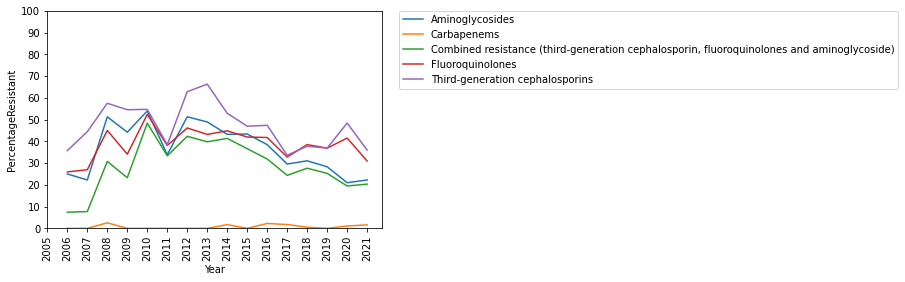

Klebsiella pneumoniae Malta


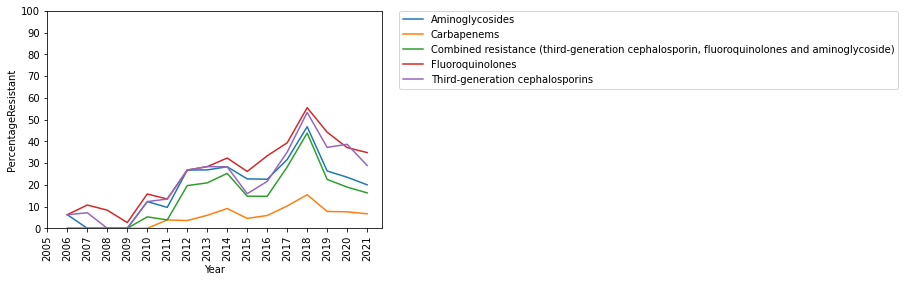

Klebsiella pneumoniae Netherlands


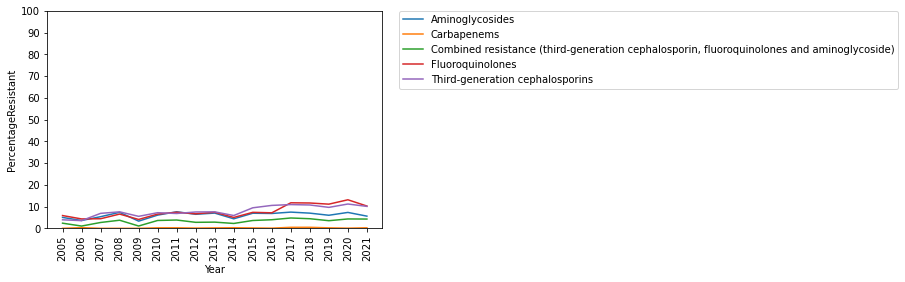

Klebsiella pneumoniae Norway


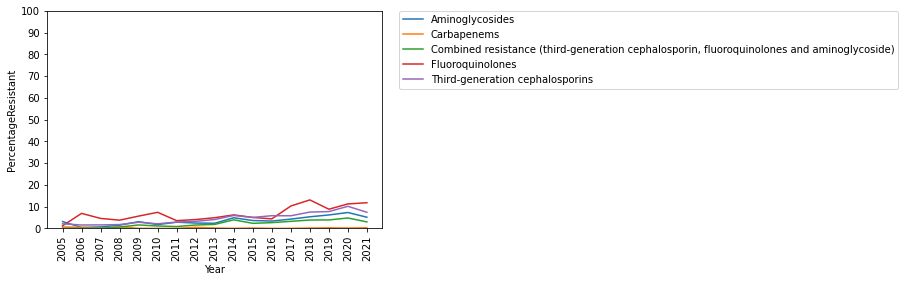

Klebsiella pneumoniae Poland


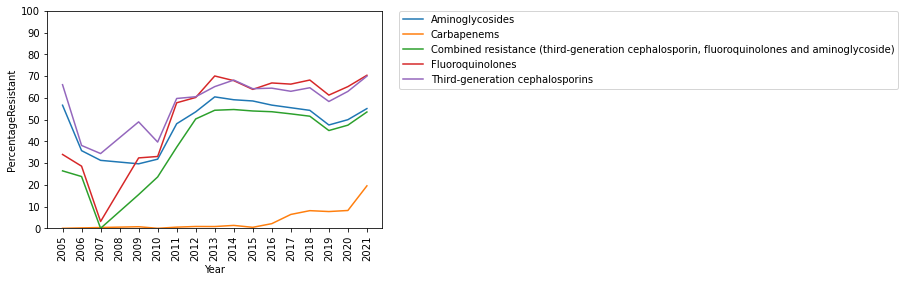

Klebsiella pneumoniae Portugal


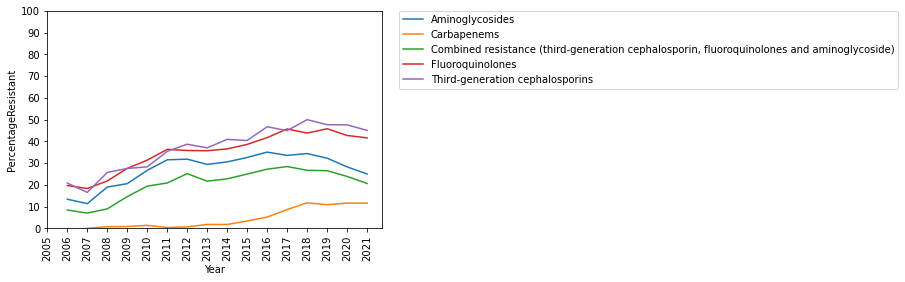

Klebsiella pneumoniae Romania


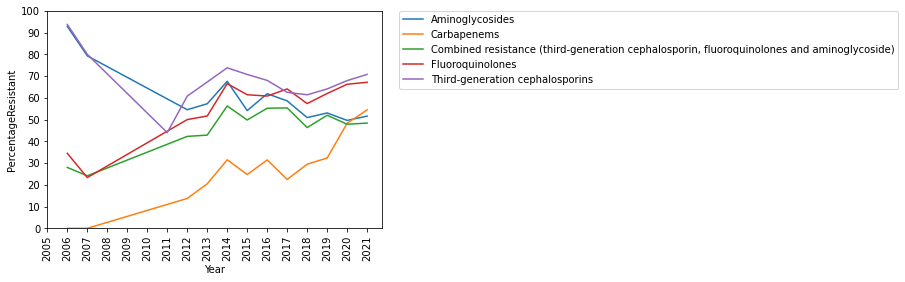

Klebsiella pneumoniae Sweden


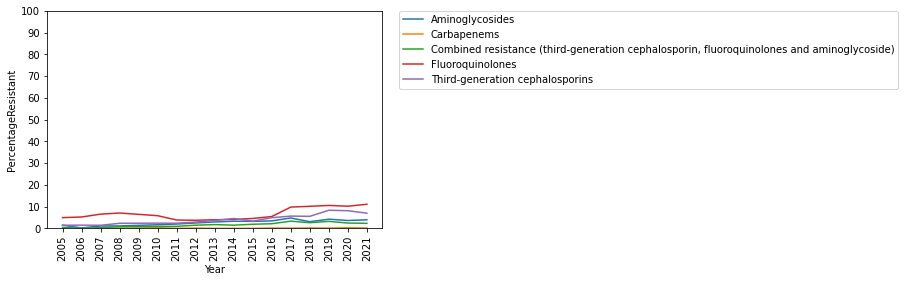

Klebsiella pneumoniae Slovenia


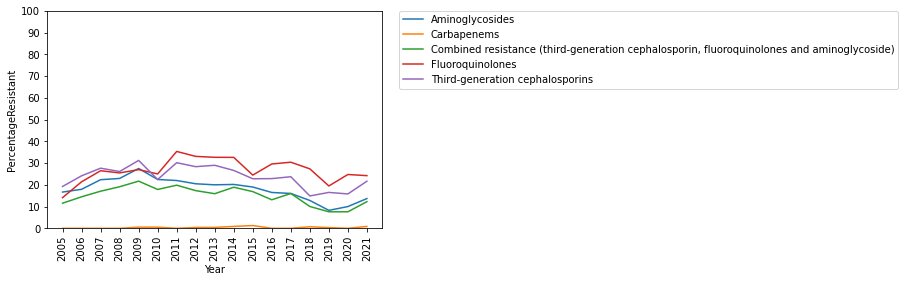

Klebsiella pneumoniae Slovakia


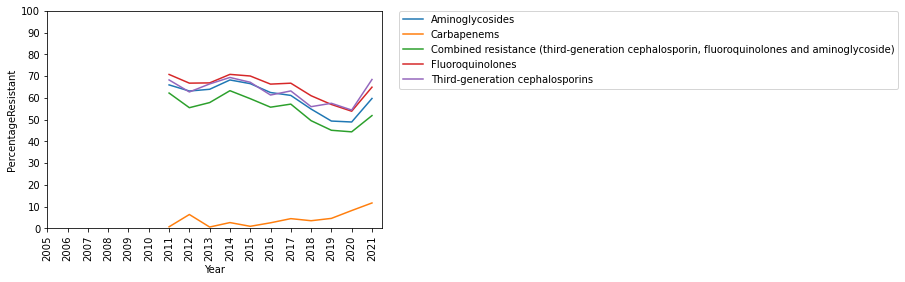

Klebsiella pneumoniae United Kingdom


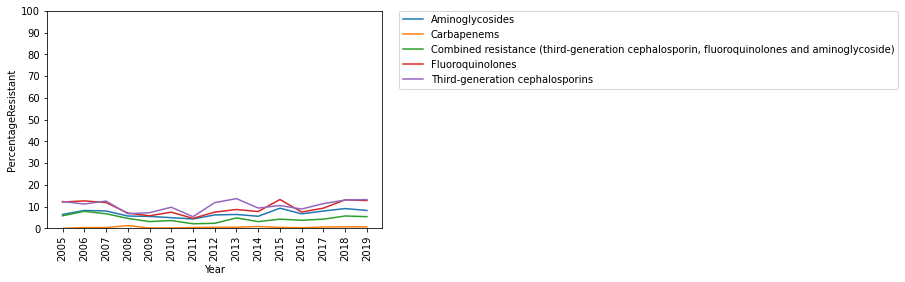

Pseudomonas aeruginosa Austria


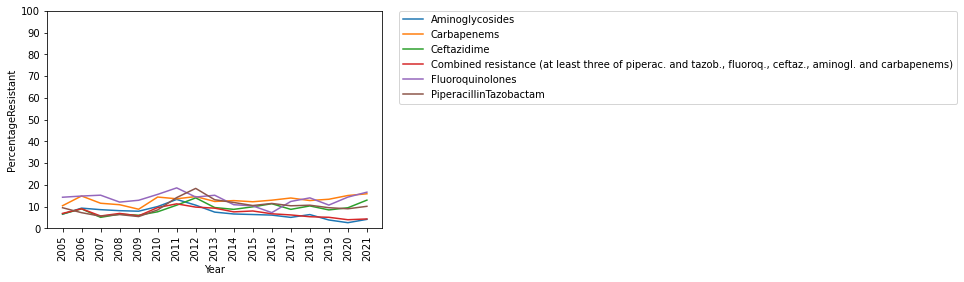

Pseudomonas aeruginosa Belgium


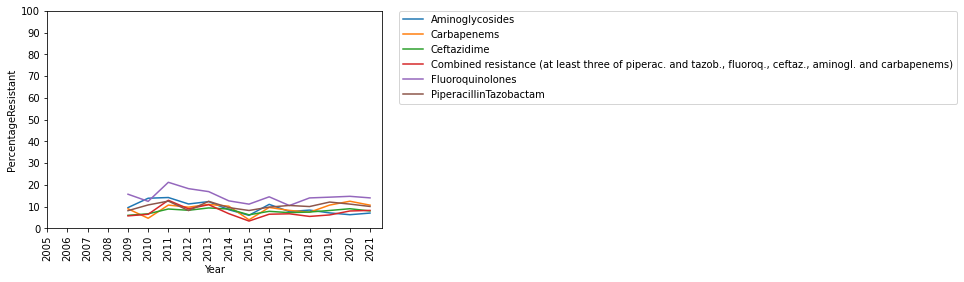

Pseudomonas aeruginosa Bulgaria


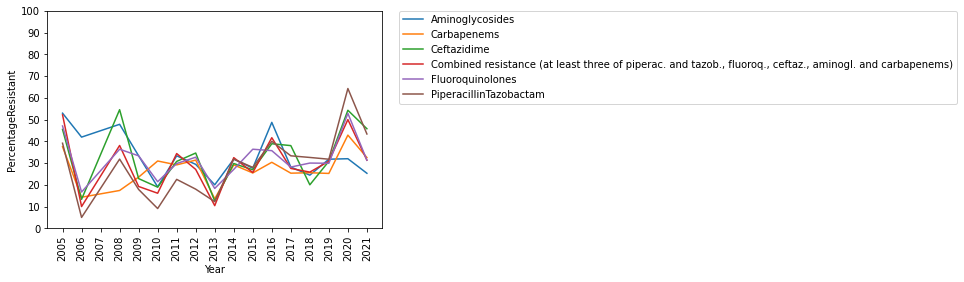

Pseudomonas aeruginosa Cyprus


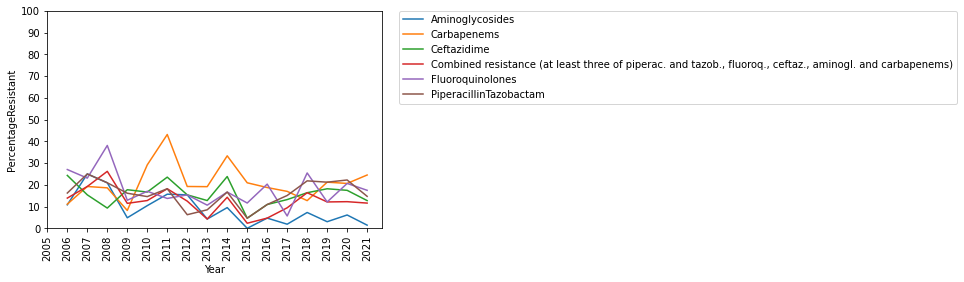

Pseudomonas aeruginosa Czechia


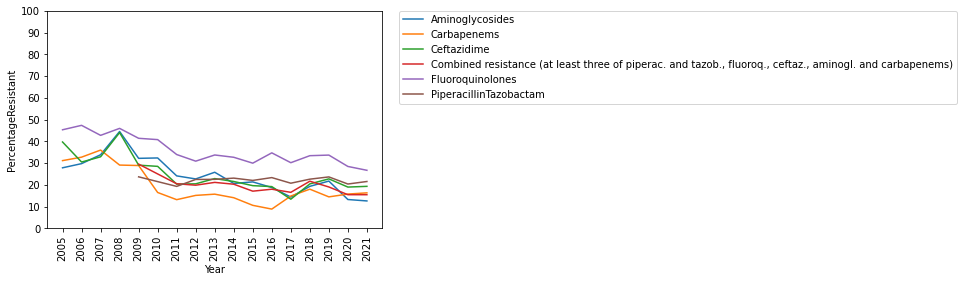

Pseudomonas aeruginosa Germany


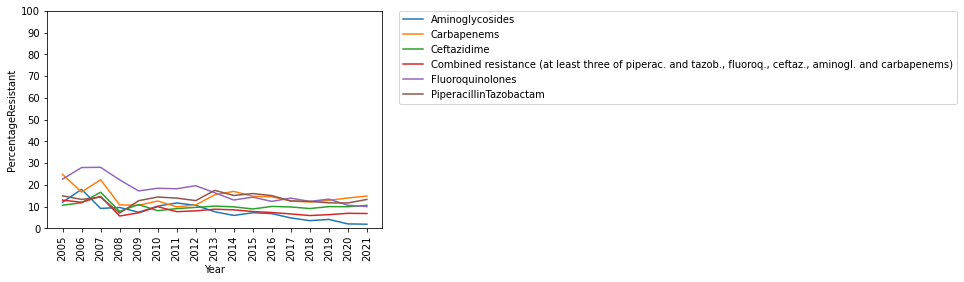

Pseudomonas aeruginosa Denmark


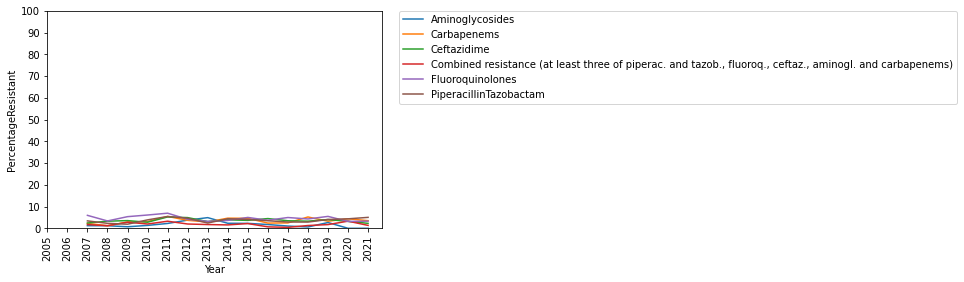

Pseudomonas aeruginosa Estonia


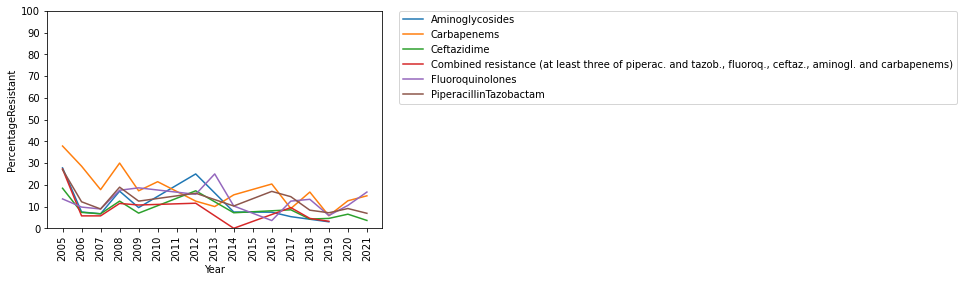

Pseudomonas aeruginosa Greece


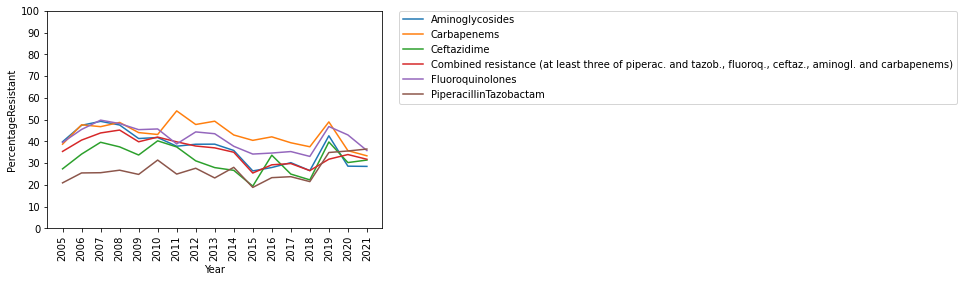

Pseudomonas aeruginosa Spain


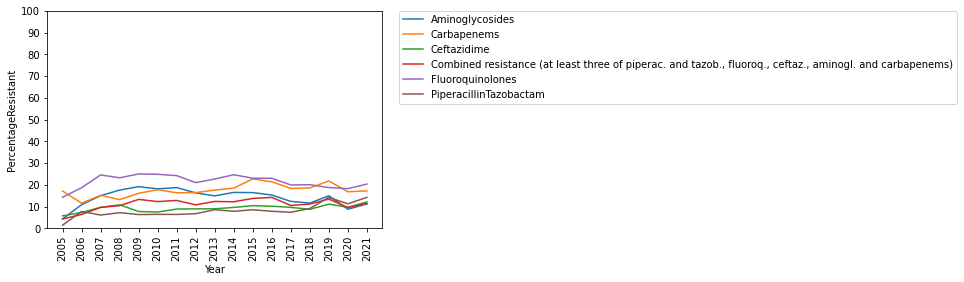

Pseudomonas aeruginosa Finland


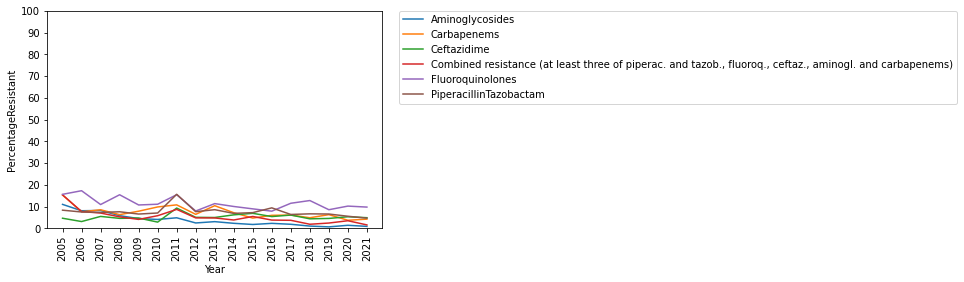

Pseudomonas aeruginosa France


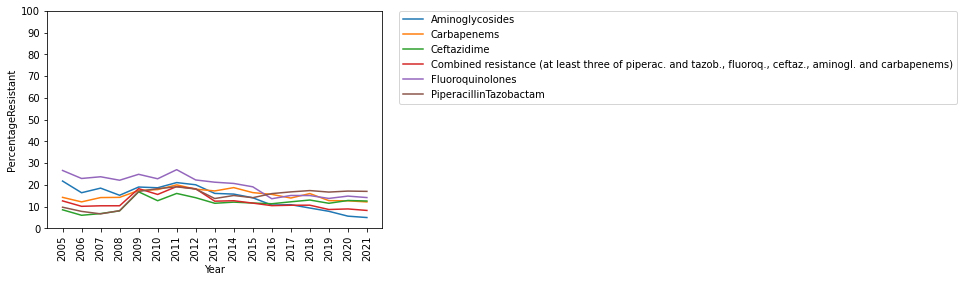

Pseudomonas aeruginosa Croatia


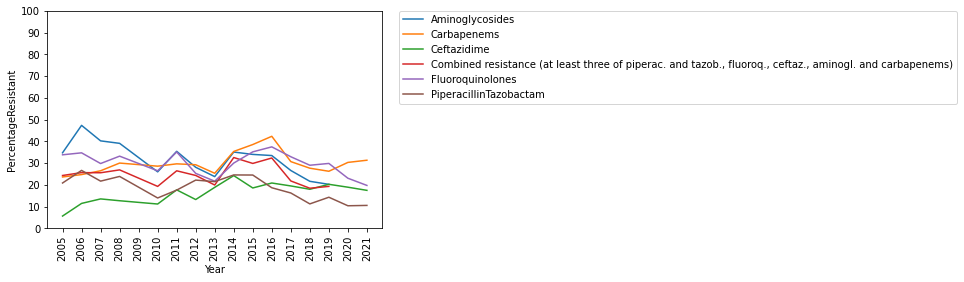

Pseudomonas aeruginosa Hungary


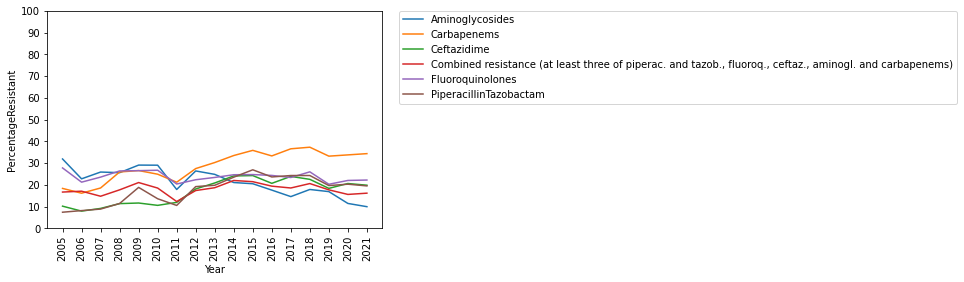

Pseudomonas aeruginosa Ireland


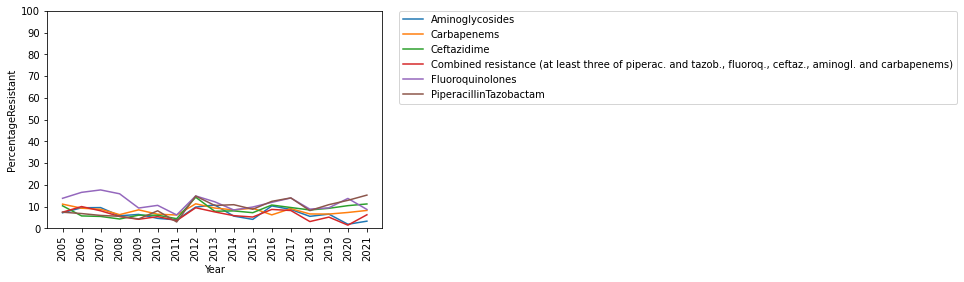

Pseudomonas aeruginosa Iceland


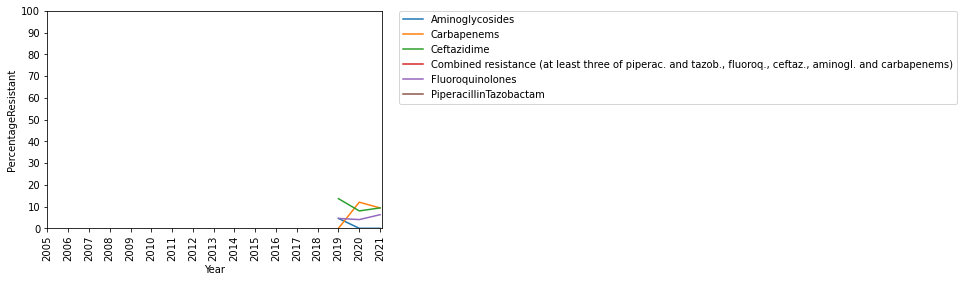

Pseudomonas aeruginosa Italy


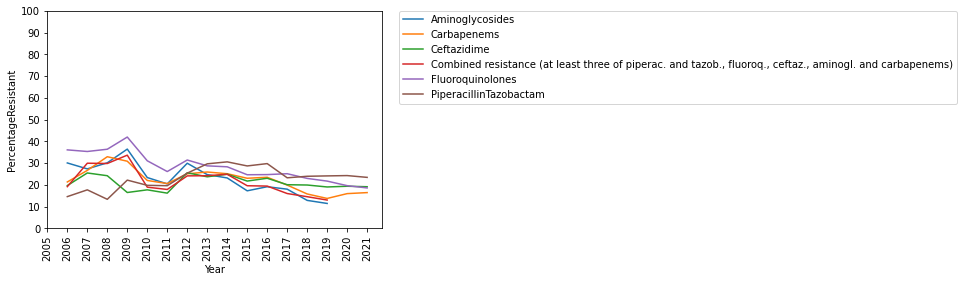

Pseudomonas aeruginosa Lithuania


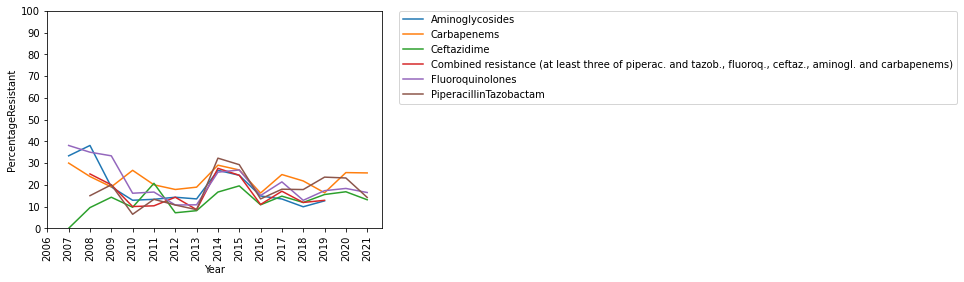

Pseudomonas aeruginosa Luxembourg


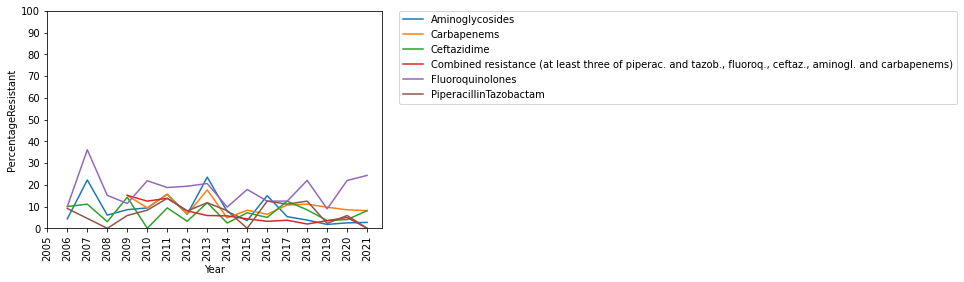

Pseudomonas aeruginosa Latvia


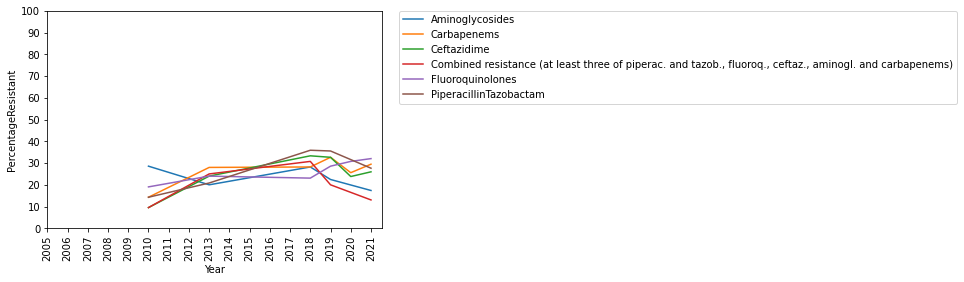

Pseudomonas aeruginosa Malta


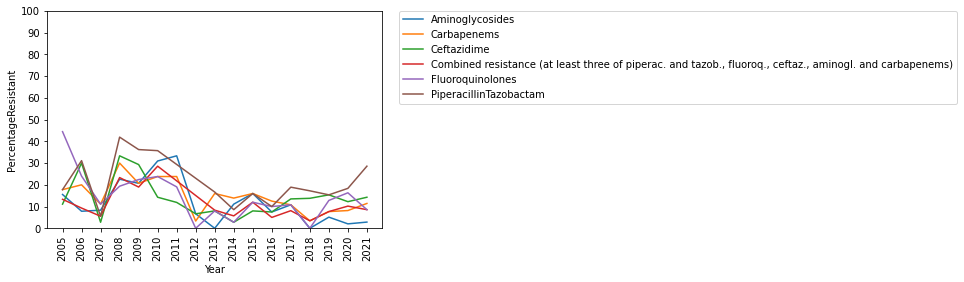

Pseudomonas aeruginosa Netherlands


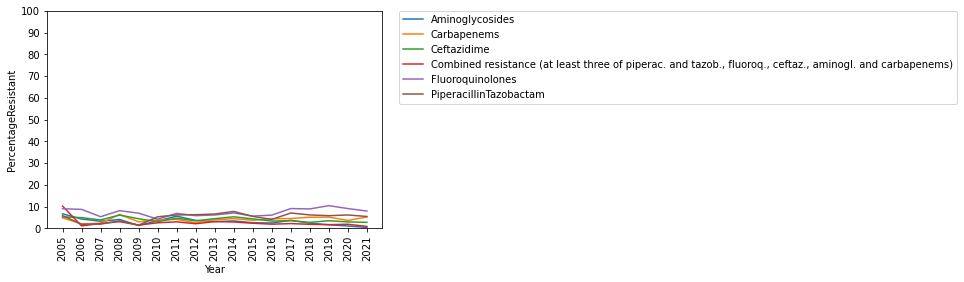

Pseudomonas aeruginosa Norway


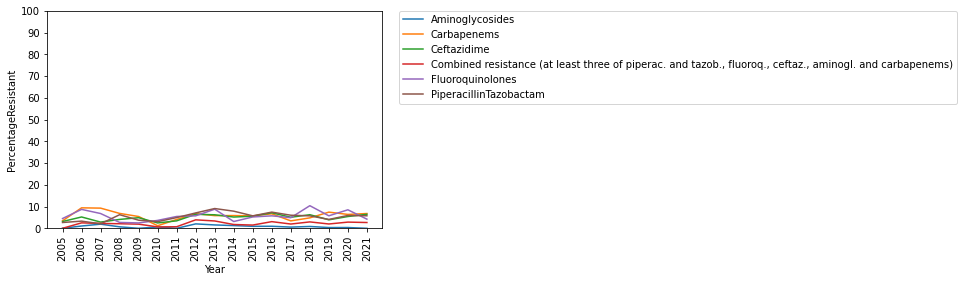

Pseudomonas aeruginosa Poland


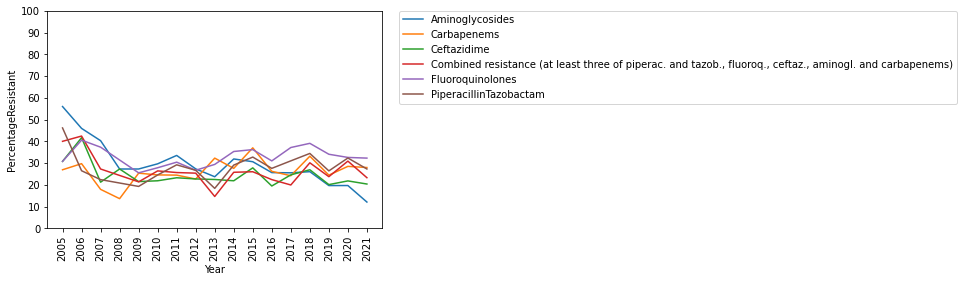

Pseudomonas aeruginosa Portugal


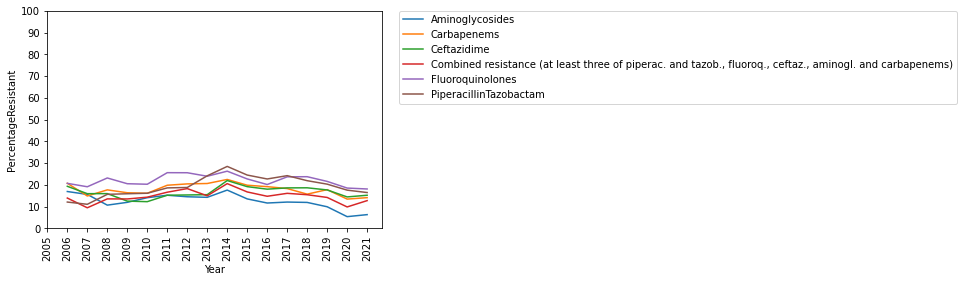

Pseudomonas aeruginosa Romania


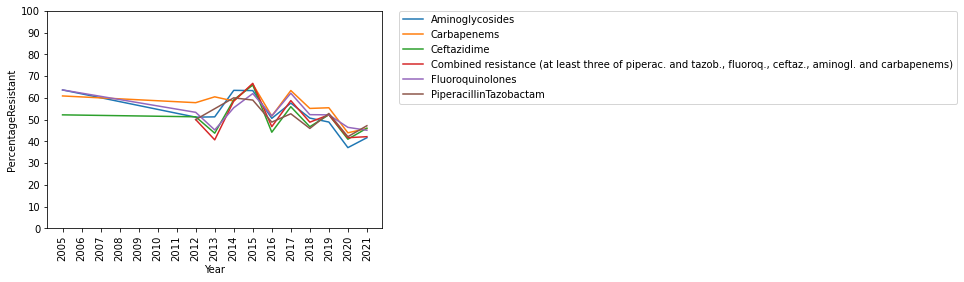

Pseudomonas aeruginosa Sweden


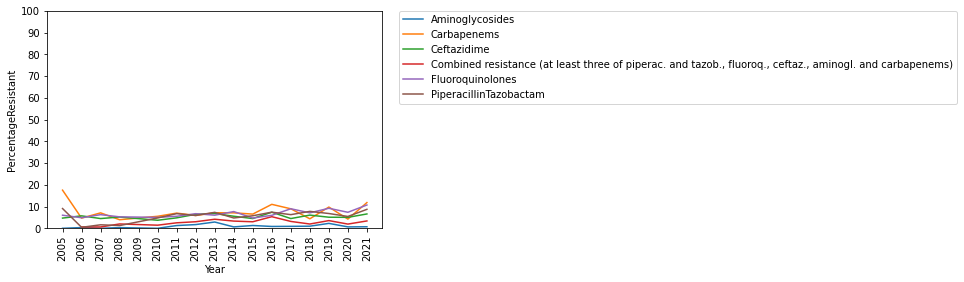

Pseudomonas aeruginosa Slovenia


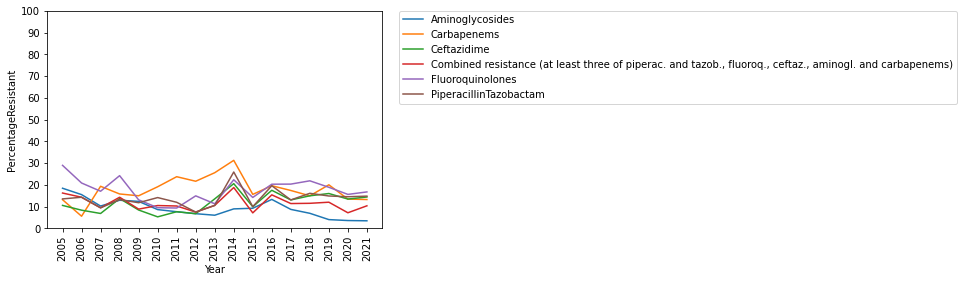

Pseudomonas aeruginosa Slovakia


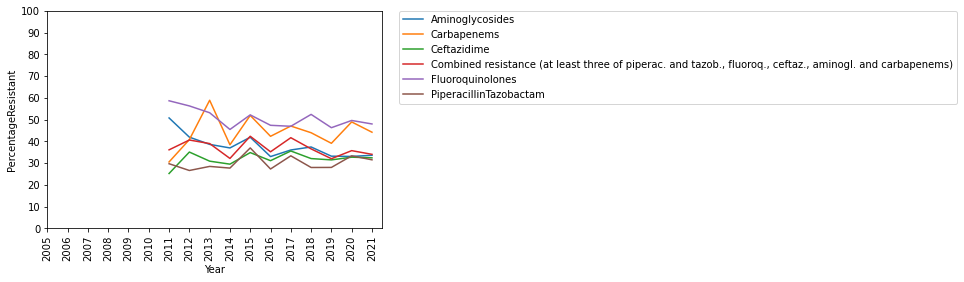

Pseudomonas aeruginosa United Kingdom


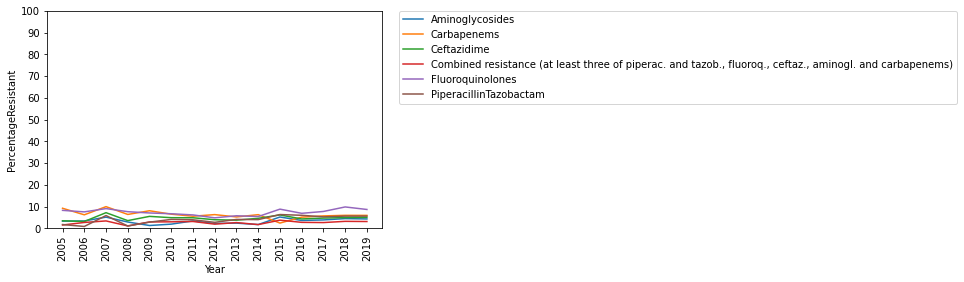

Staphylococcus aureus Austria


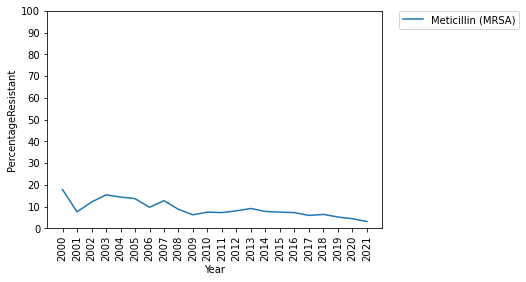

Staphylococcus aureus Belgium


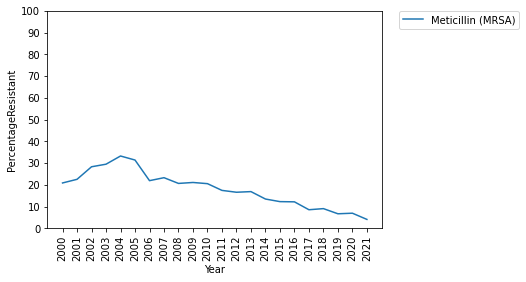

Staphylococcus aureus Bulgaria


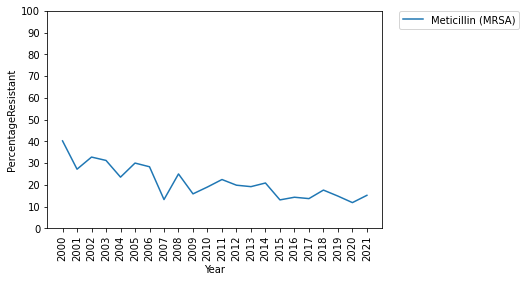

Staphylococcus aureus Cyprus


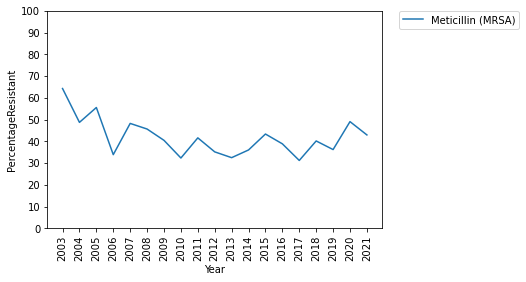

Staphylococcus aureus Czechia


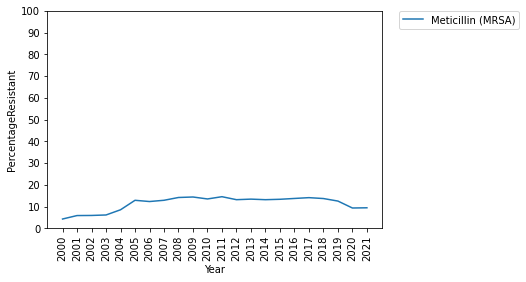

Staphylococcus aureus Germany


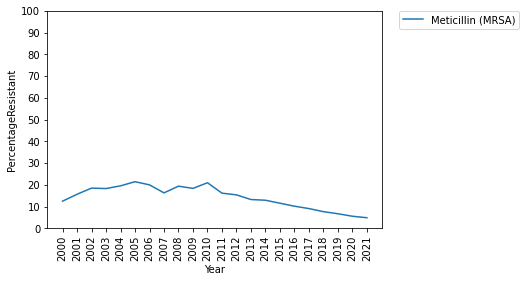

Staphylococcus aureus Denmark


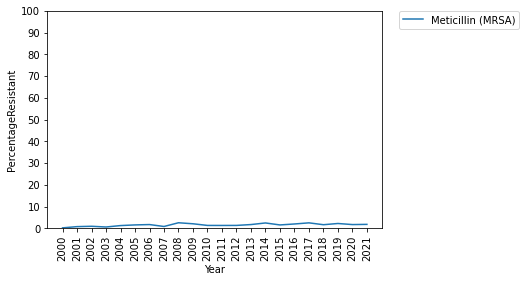

Staphylococcus aureus Estonia


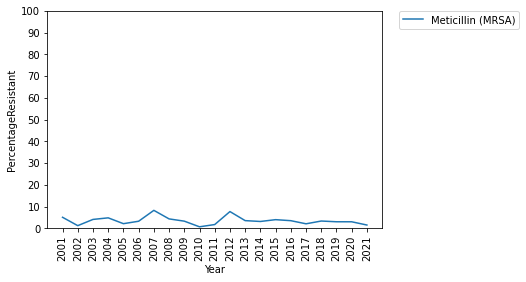

Staphylococcus aureus Greece


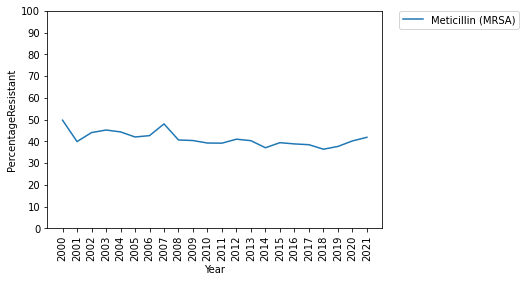

Staphylococcus aureus Spain


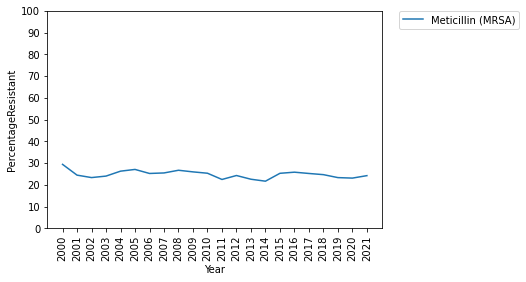

Staphylococcus aureus Finland


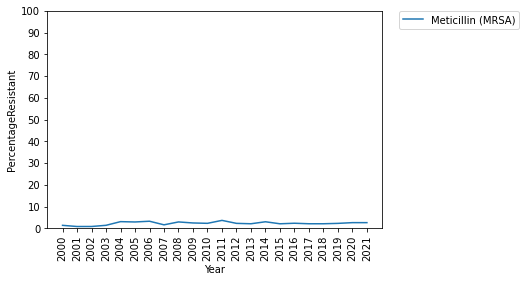

Staphylococcus aureus France


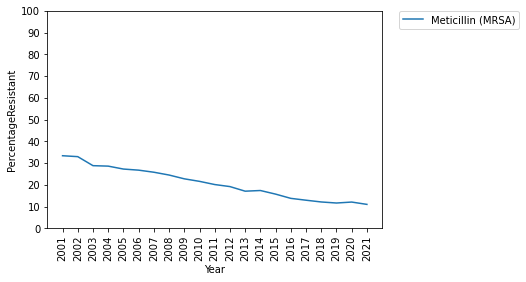

Staphylococcus aureus Croatia


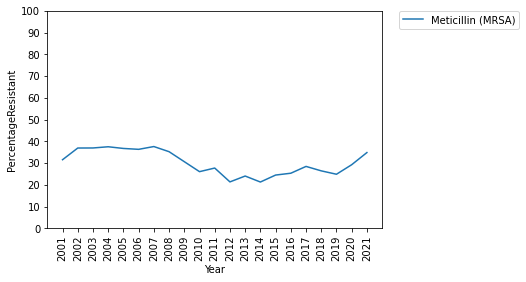

Staphylococcus aureus Hungary


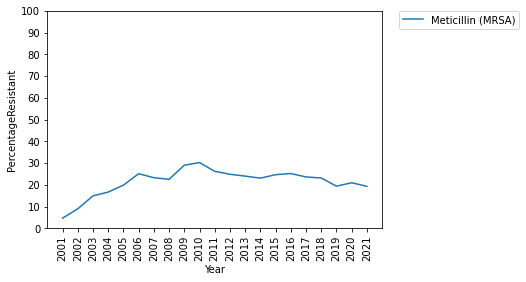

Staphylococcus aureus Ireland


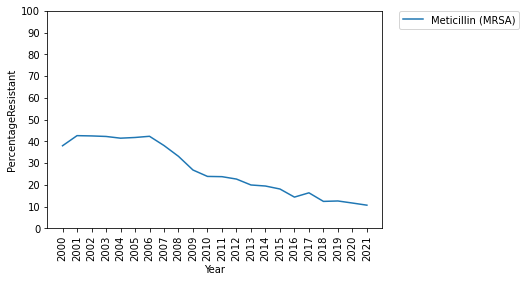

Staphylococcus aureus Iceland


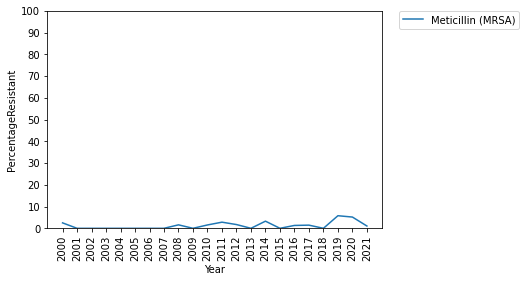

Staphylococcus aureus Italy


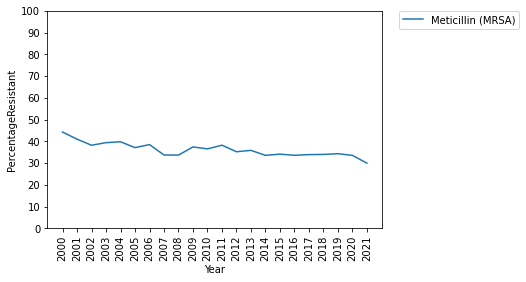

Staphylococcus aureus Lithuania


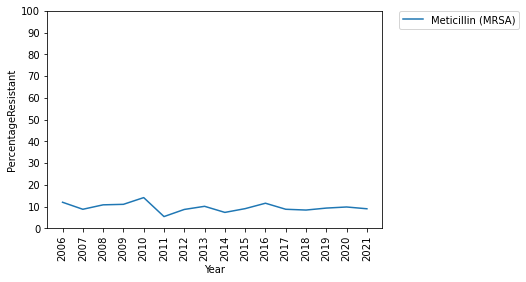

Staphylococcus aureus Luxembourg


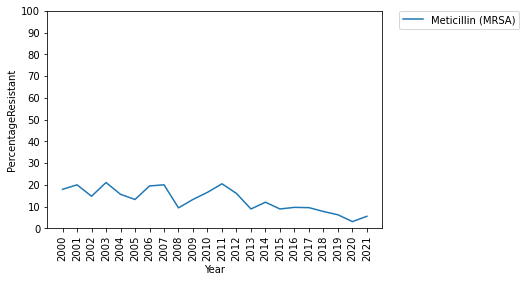

Staphylococcus aureus Latvia


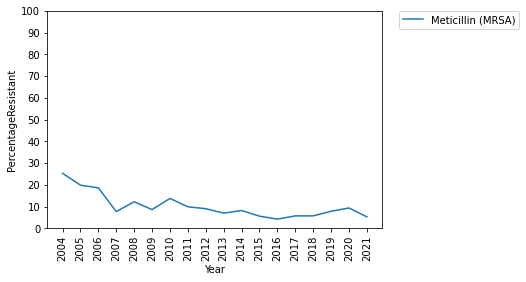

Staphylococcus aureus Malta


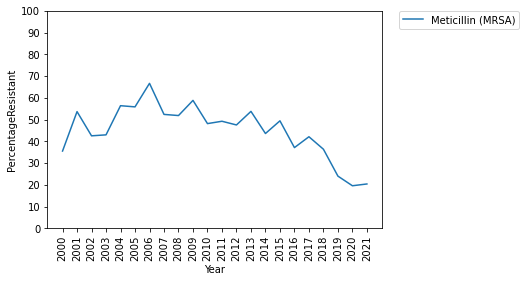

Staphylococcus aureus Netherlands


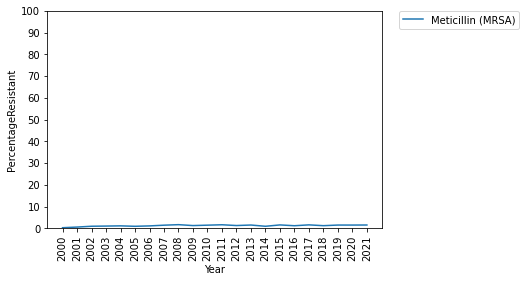

Staphylococcus aureus Norway


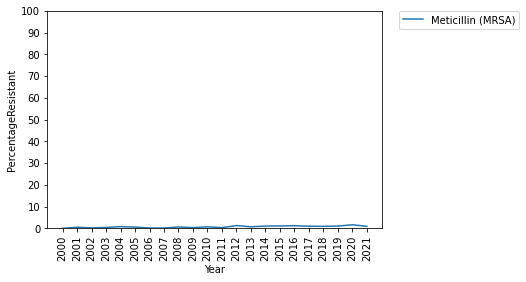

Staphylococcus aureus Poland


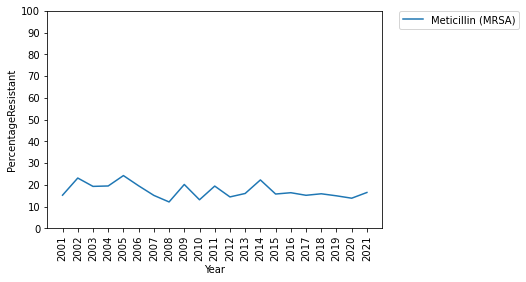

Staphylococcus aureus Portugal


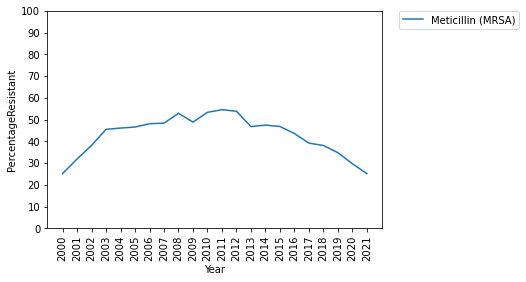

Staphylococcus aureus Romania


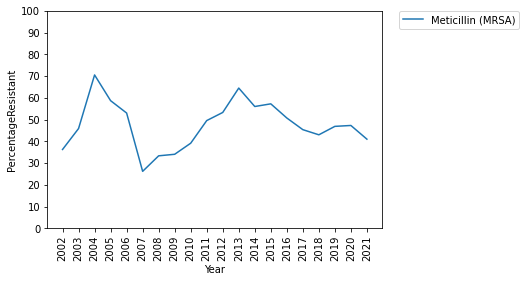

Staphylococcus aureus Sweden


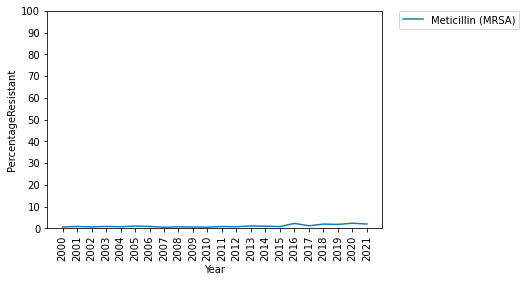

Staphylococcus aureus Slovenia


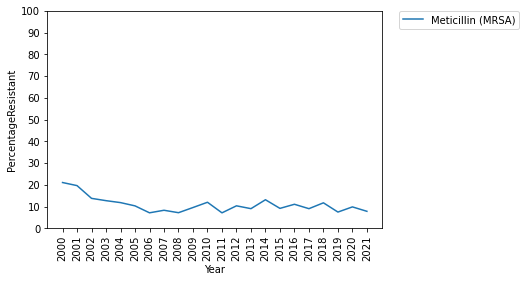

Staphylococcus aureus Slovakia


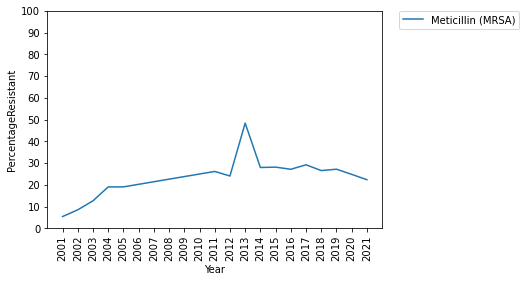

Staphylococcus aureus United Kingdom


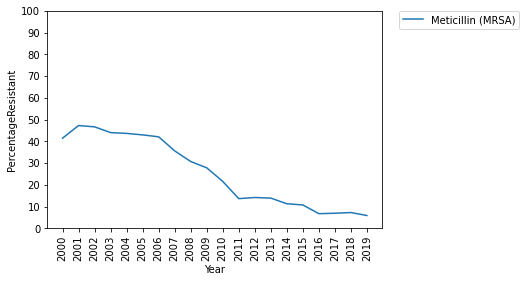

Streptococcus pneumoniae Austria


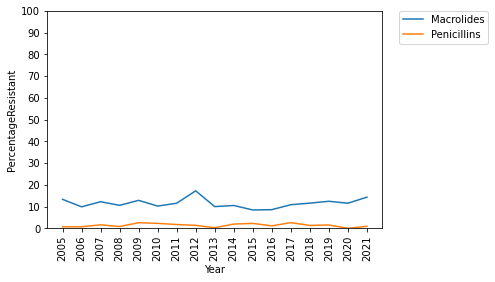

Streptococcus pneumoniae Belgium


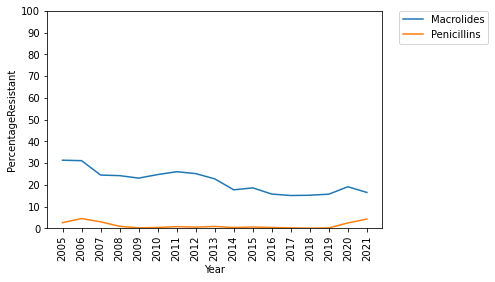

Streptococcus pneumoniae Bulgaria


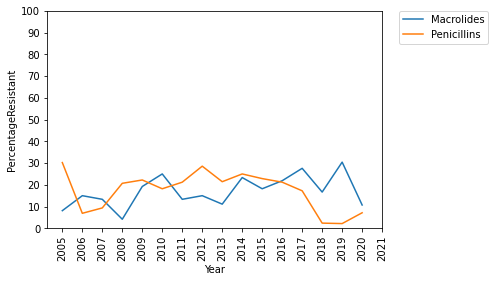

Streptococcus pneumoniae Cyprus


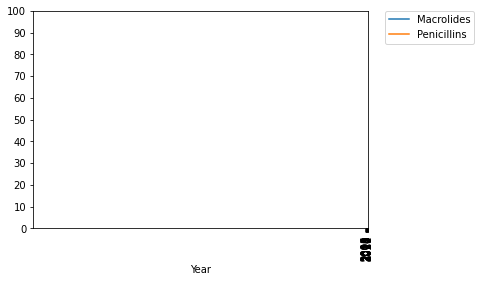

Streptococcus pneumoniae Czechia


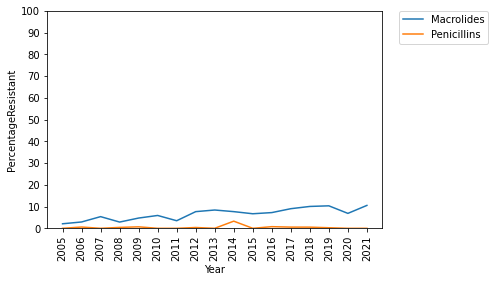

Streptococcus pneumoniae Germany


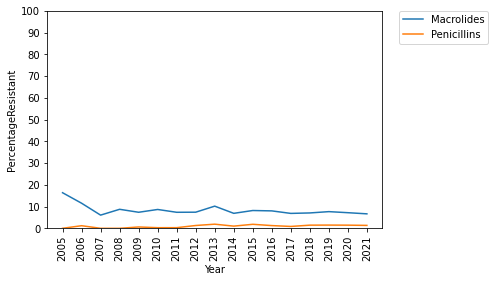

Streptococcus pneumoniae Denmark


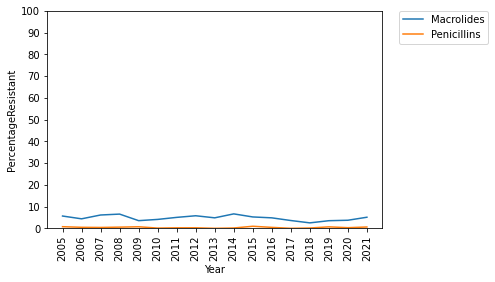

Streptococcus pneumoniae Estonia


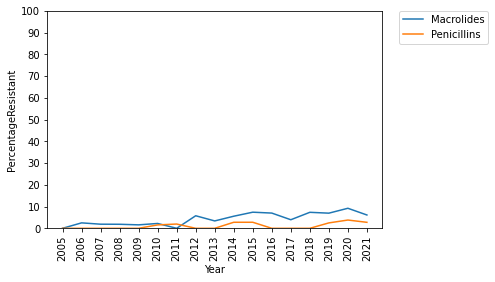

Streptococcus pneumoniae Greece


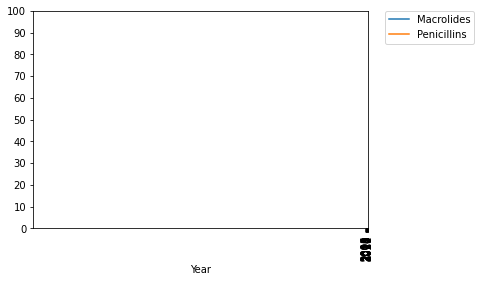

Streptococcus pneumoniae Spain


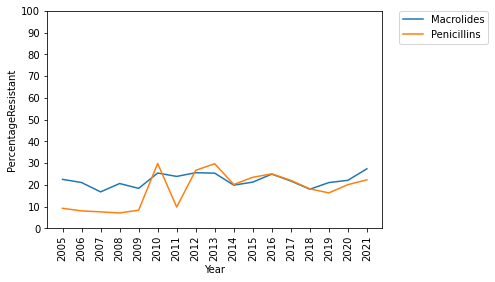

Streptococcus pneumoniae Finland


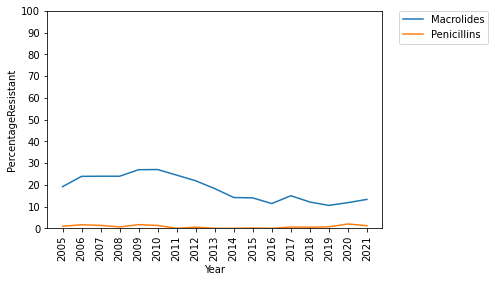

Streptococcus pneumoniae France


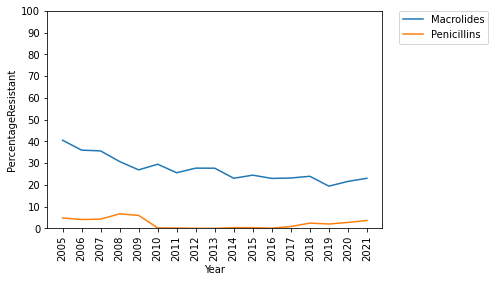

Streptococcus pneumoniae Croatia


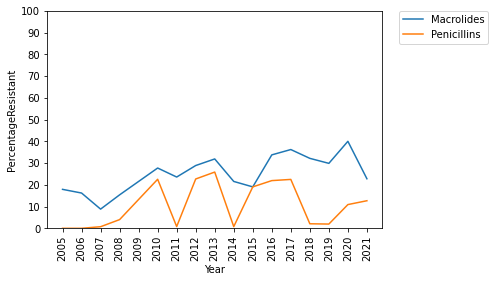

Streptococcus pneumoniae Hungary


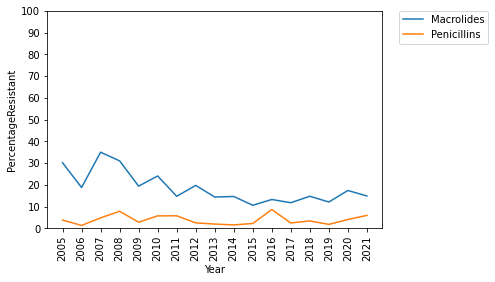

Streptococcus pneumoniae Ireland


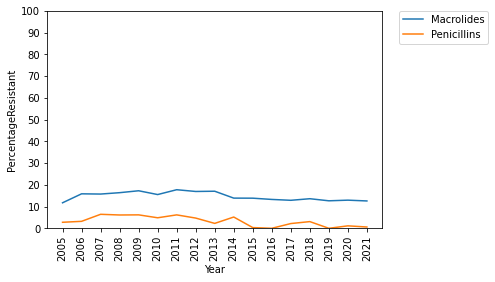

Streptococcus pneumoniae Iceland


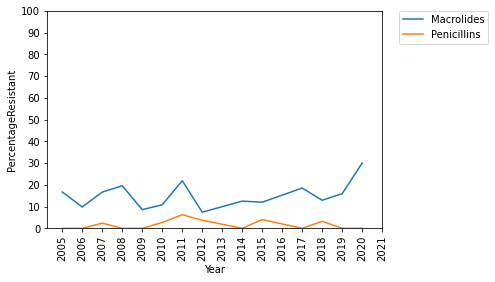

Streptococcus pneumoniae Italy


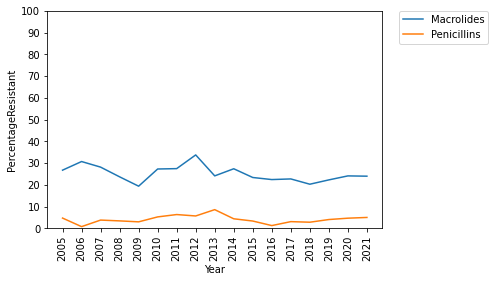

Streptococcus pneumoniae Lithuania


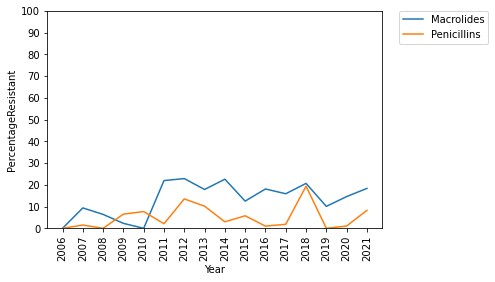

Streptococcus pneumoniae Luxembourg


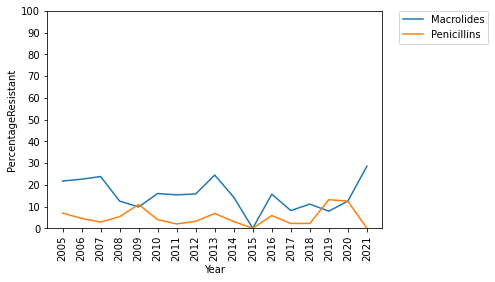

Streptococcus pneumoniae Latvia


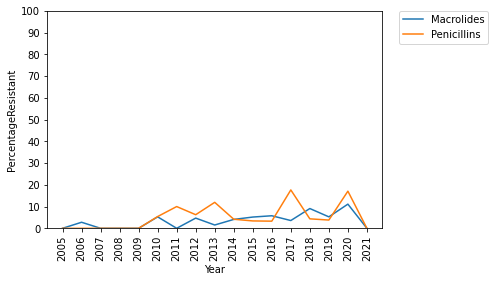

Streptococcus pneumoniae Malta


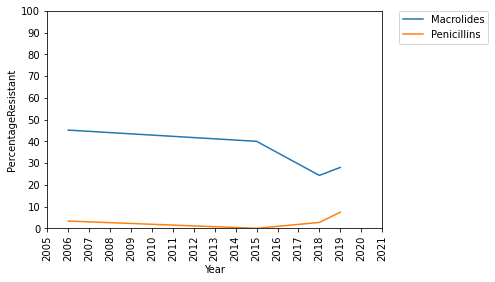

Streptococcus pneumoniae Netherlands


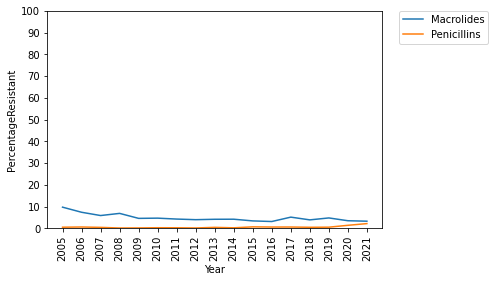

Streptococcus pneumoniae Norway


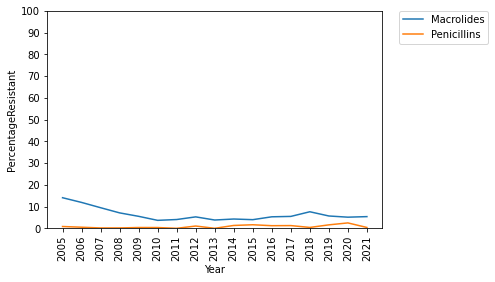

Streptococcus pneumoniae Poland


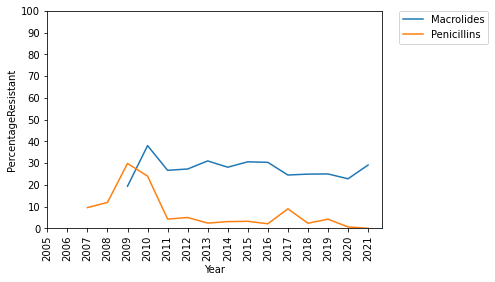

Streptococcus pneumoniae Portugal


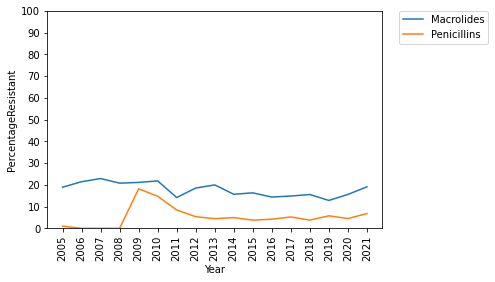

Streptococcus pneumoniae Romania


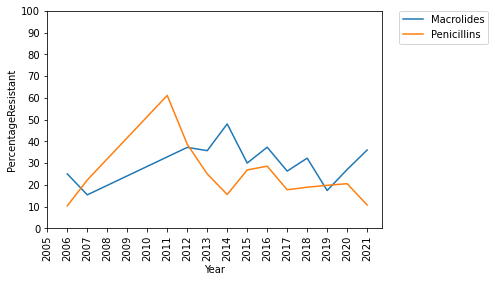

Streptococcus pneumoniae Sweden


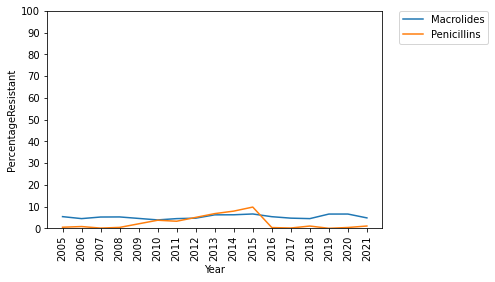

Streptococcus pneumoniae Slovenia


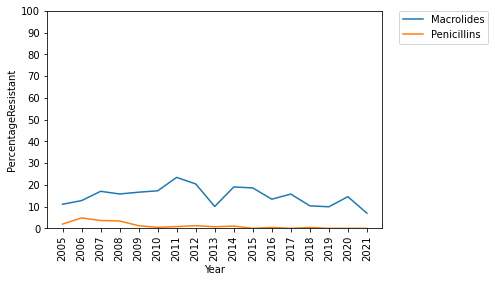

Streptococcus pneumoniae Slovakia


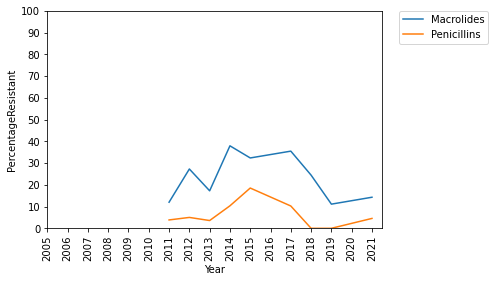

Streptococcus pneumoniae United Kingdom


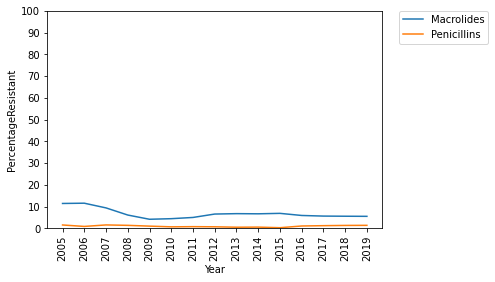

In [11]:
for organism in amr_df.Organism.unique():
    for regionname in amr_df.RegionName.unique():
        print(organism, regionname)
        temp_df=amr_df.query("Organism==@organism and RegionName==@regionname")
        sns.lineplot(x="Year", y="PercentageResistant",hue='AntimicrobialGroup', data=temp_df, ci=None)
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        plt.gca().set_ylim(0, 100)
        plt.gca().set_yticks(range(0, 101, 10))
        #Set x ticks to only show years
        plt.xticks(range(min(temp_df['Year']), max(temp_df['Year'])+1))
        plt.xticks(rotation=90);
        plt.show()

# Percentage resistance in Acinetobacter spp for all years, all countries

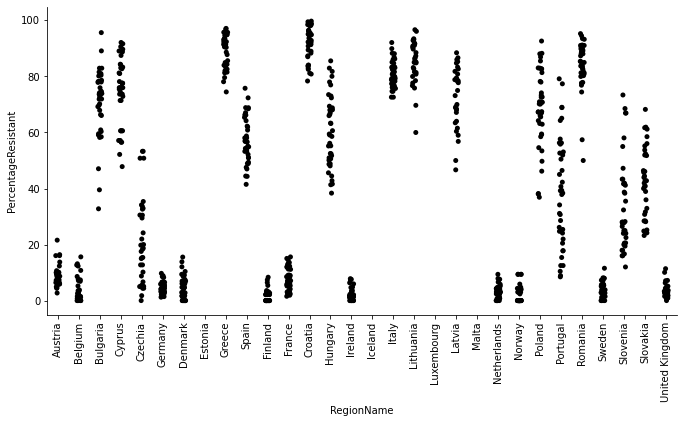

In [12]:
sns.catplot(x='RegionName', y='PercentageResistant', data=amr_df.query("Organism=='Acinetobacter spp.'"), color='black', kind='strip', height=5, aspect = 2)
plt.xticks(rotation=90);

# Choropleth plot of percentage resistance in isolates of Acinetobacter spp in 2019

In [13]:
import plotly.express as px
amr_df_2019=amr_df.query('Year == 2019')
# Create a choropleth map
fig = px.choropleth(amr_df_2019.query("Organism=='Acinetobacter spp.'"), locations='RegionName', locationmode='country names', color='PercentageResistant', title='Acinetobacter resistance % of isolates', scope='europe', color_continuous_scale="blues")
fig.show()

In [14]:
amr_df

,Organism,AntimicrobialGroup,Indicator,Year,RegionCode,RegionName,PercentageResistant
0,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,AT,Austria,NaN
1,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,BE,Belgium,NaN
2,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,BG,Bulgaria,58.461538
3,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,CY,Cyprus,52.173913
4,Acinetobacter spp.,Aminoglycosides,"R - resistant isolates, percentage",2012,CZ,Czechia,NaN
...,...,...,...,...,...,...,...
15924,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,PT,Portugal,6.775068
15925,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,RO,Romania,10.714286
15926,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,SE,Sweden,1.047904
15927,Streptococcus pneumoniae,Penicillins,"R - resistant isolates, percentage",2021,SI,Slovenia,0.000000
